In [1]:
!pip install visualkeras
from IPython.display import clear_output
clear_output(wait=False)

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import random
import os
import matplotlib.pyplot as plt
import seaborn as sns
from keras.utils import plot_model
from tensorflow.keras import models
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import legacy
from tensorflow.keras.optimizers import AdamW
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report, confusion_matrix 
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img

In [3]:
# Global variables
SAVE = False
SEED = 111

# Setting seed for consistent results
tf.keras.utils.set_random_seed(SEED)
tf.random.set_seed(SEED)
np.random.seed(SEED)

# Data Visualization updates
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = (16, 10)
plt.rcParams.update({'font.size': 14})

# Data Classifications
CLASS_TYPES = ['pituitary', 'notumor', 'meningioma', 'glioma']
N_TYPES = len(CLASS_TYPES)

# Image size
image_size = (150, 150)

# Training batch size
batch_size = 32

# Training batch size
epochs = 128

# Image shape: height, width, RBG
image_shape = (image_size[0], image_size[1], 3)

In [4]:
# Function for inporting data           
def get_data_labels(directory, shuffle=True, random_state=0):
    """
    Function used for going into the main training directory
    whose directory has sub-class-types.
    """
    from sklearn.utils import shuffle
    import os

    # Lists to store data and labels
    data_path = []
    data_labels = []
    
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)

        # Avoid MacOS storing path
        if not os.path.isdir(label_dir):
            continue

        # Going into each folder and getting image path
        for image in os.listdir(label_dir):
            image_path = os.path.join(label_dir, image)
            data_path.append(image_path)
            data_labels.append(label)
            
    if shuffle:
        data_path, data_labels = shuffle(data_path, data_labels, random_state=random_state)
            
    return data_path, data_labels
# Setting up file paths for training and testing
USER_PATH = "/kaggle/input/brain-tumor-mri-dataset"
train_dir = USER_PATH + "/Training/"
test_dir = USER_PATH + "/Testing/"
save_path = './Optimizer_MRI_AdamW'
# Getting data using above function
train_paths, train_labels = get_data_labels(train_dir)
test_paths, test_labels = get_data_labels(test_dir)

# Printing traing and testing sample sizes
print('Training')
print(f'Number of Paths: {len(train_paths)}')
print(f'Number of Labels: {len(train_labels)}')
print('\nTesting')
print(f'Number of Paths: {len(test_paths)}')
print(f'Number of Labels: {len(test_labels)}')

Training
Number of Paths: 5712
Number of Labels: 5712

Testing
Number of Paths: 1311
Number of Labels: 1311


In [5]:
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)

# –––––––––––––––––––––––––––––––––––––– #
# Output Images and Labels Visualization #
# –––––––––––––––––––––––––––––––––––––– #
def plot_sample_predictions(model, test_generator, categories, test_dir, num_samples=9, figsize=(12, 8)):
    """
    Nice display of prediction samples to see CNN predictions
    for classification.
    """
    # Make predictions on the test dataset
    predictions = model.predict(test_generator)
    predicted_categories = np.argmax(predictions, axis=1)
    true_categories = test_generator.classes

    # Randomly sample test images
    test_images = np.array(test_generator.filepaths)
    sample_indices = np.random.choice(len(test_images), size=num_samples, replace=False)
    sample_images = test_images[sample_indices]
    sample_predictions = [categories[predicted_categories[i]] for i in sample_indices]
    sample_true_labels = [categories[true_categories[i]] for i in sample_indices]

    # Plot sample images with their predicted and true labels
    plt.figure(figsize=figsize)
    
    # Loop over samples
    for i, image_path in enumerate(sample_images):
        # Form subplot and plot
        plt.subplot(3, 3, i + 1)
        img = plt.imread(image_path)
        plt.imshow(img)
        plt.axis("off")
        
        # Set axis label color depending on correct prediction or not
        prediction_color = 'green' if sample_predictions[i] == sample_true_labels[i] else 'red'
        plt.title(f"Predicted: {sample_predictions[i]}\nTrue: {sample_true_labels[i]}", color=prediction_color)
        
    plt.tight_layout()
    plt.show()

    
# –––––––––––––––––––––––––––––––––––––– #
#            Confusion matrix            #
# –––––––––––––––––––––––––––––––––––––– #
def CM(CNN_model, test_generator, categories):
    """
    Function to return the confusion matrix of a given CNN model.
    """
    from sklearn.metrics import confusion_matrix
    # Predictions on test dataset
    predictions = CNN_model.predict(test_generator)
    predicted_categories = np.argmax(predictions, axis=1)
    true_categories = test_generator.classes

    # Create a confusion matrix
    confusion_matrix_array = confusion_matrix(true_categories, predicted_categories)
    
    return confusion_matrix_array


# –––––––––––––––––––––––––––––––––––––– #
#             Metric Analysis            #
# –––––––––––––––––––––––––––––––––––––– #
def calculate_metrics(confusion_matrix, categories):
    """
    Function to calculate important metrics for multi-classification problems.
    """
    # Calculating 4 different metrics
    precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=0)
    recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=1)
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = np.sum(np.diag(confusion_matrix)) / np.sum(confusion_matrix)

    # Printing the results based on each category
    for i, category in enumerate(categories):
        print(f"Class: {category.title()}")
        print(f"Precision: {precision[i]:.3f}")
        print(f"Recall: {recall[i]:.3f}")
        print(f"F1-Score: {f1_score[i]:.3f}\n")
        
    # Showing the total accuracy of the model
    print(f"\nAccuracy: {accuracy:.3f}")
# Accessing class indices for training data generator
class_indices_train = train_generator.class_indices
class_indices_train_list = list(train_generator.class_indices.keys())

# Displaying categorical types
print("Categorical types for the training data:")
print(class_indices_train)    

# Steps per epoch
steps_per_epoch = train_generator.samples // batch_size

# Validation steps
validation_steps = test_generator.samples // batch_size

print(f'Image shape: {image_shape}')
print(f'Epochs: {epochs}')
print(f'Batch size: {batch_size}')
print(f'Steps Per Epoch: {steps_per_epoch}')
print(f'Validation steps: {validation_steps}')

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.
Categorical types for the training data:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
Image shape: (150, 150, 3)
Epochs: 128
Batch size: 32
Steps Per Epoch: 178
Validation steps: 40


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d has kernel size: (4, 4)
Layer conv2d_1 has kernel size: (4, 4)
Layer conv2d_2 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1752312930.895247      83 service.cc:145] XLA service 0x7a42dc006060 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752312930.895306      83 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/178 ━━━━━━━━━━━━━━━━━━━━ 22:49 8s/step - accuracy: 0.2188 - loss: 1.3792

I0000 00:00:1752312934.397828      83 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


178/178 ━━━━━━━━━━━━━━━━━━━━ 76s 386ms/step - accuracy: 0.5825 - loss: 0.9488 - val_accuracy: 0.6234 - val_loss: 1.0760 - learning_rate: 0.0010
Epoch 2/128
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7500 - loss: 0.4989

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7500 - loss: 0.4989 - val_accuracy: 0.4194 - val_loss: 1.2516 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 239ms/step - accuracy: 0.7925 - loss: 0.5217 - val_accuracy: 0.7656 - val_loss: 0.6382 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - accuracy: 0.7500 - loss: 0.5592 - val_accuracy: 0.9355 - val_loss: 0.2832 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 237ms/step - accuracy: 0.8366 - loss: 0.4099 - val_accuracy: 0.7172 - val_loss: 0.6586 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - accuracy: 0.9688 - loss: 0.2438 - val_accuracy: 0.9677 - val_loss: 0.1095 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 234ms/step - accuracy: 0.8765 - loss: 0.3244 - val_accuracy: 0.8117 - val_loss: 0.4757 - learning_rate: 0.0010
Epoch 8/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step - accuracy: 0.8125 - loss:

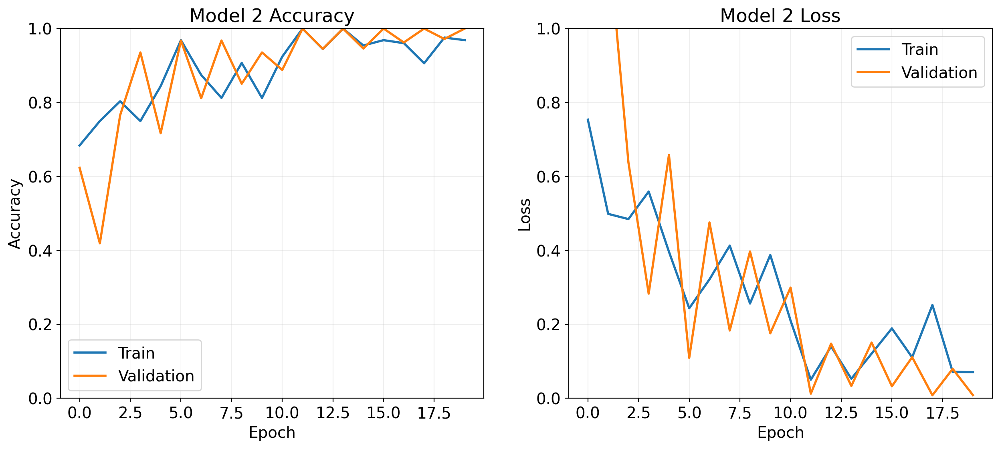

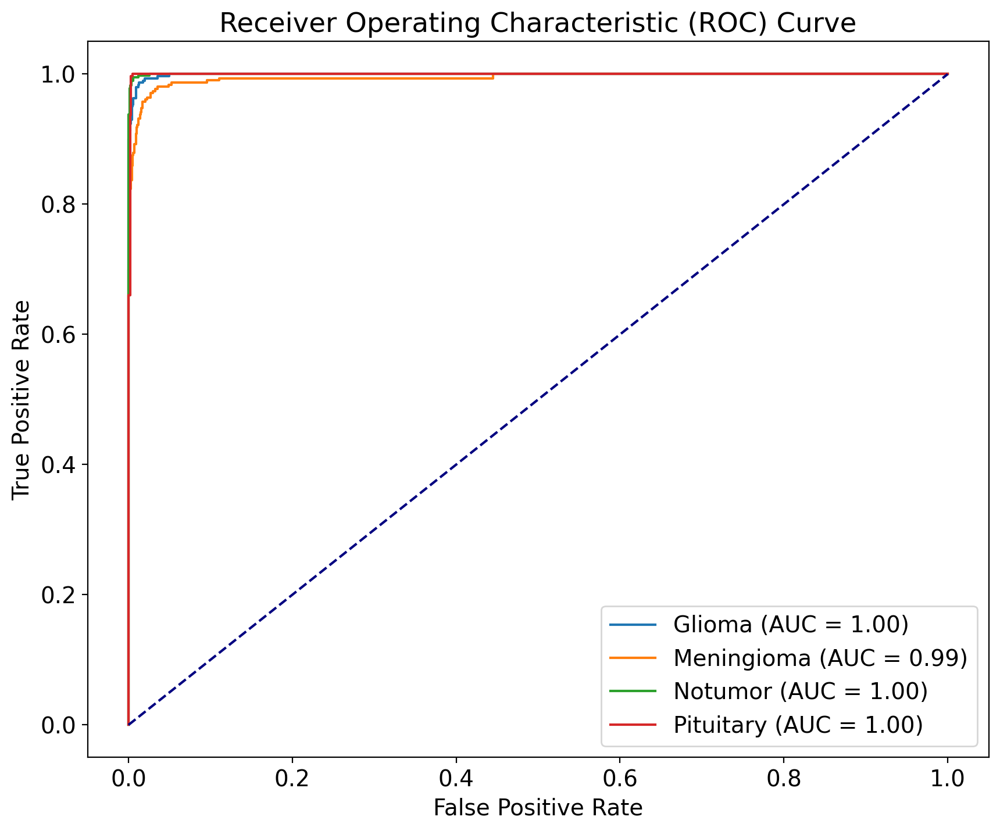

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step


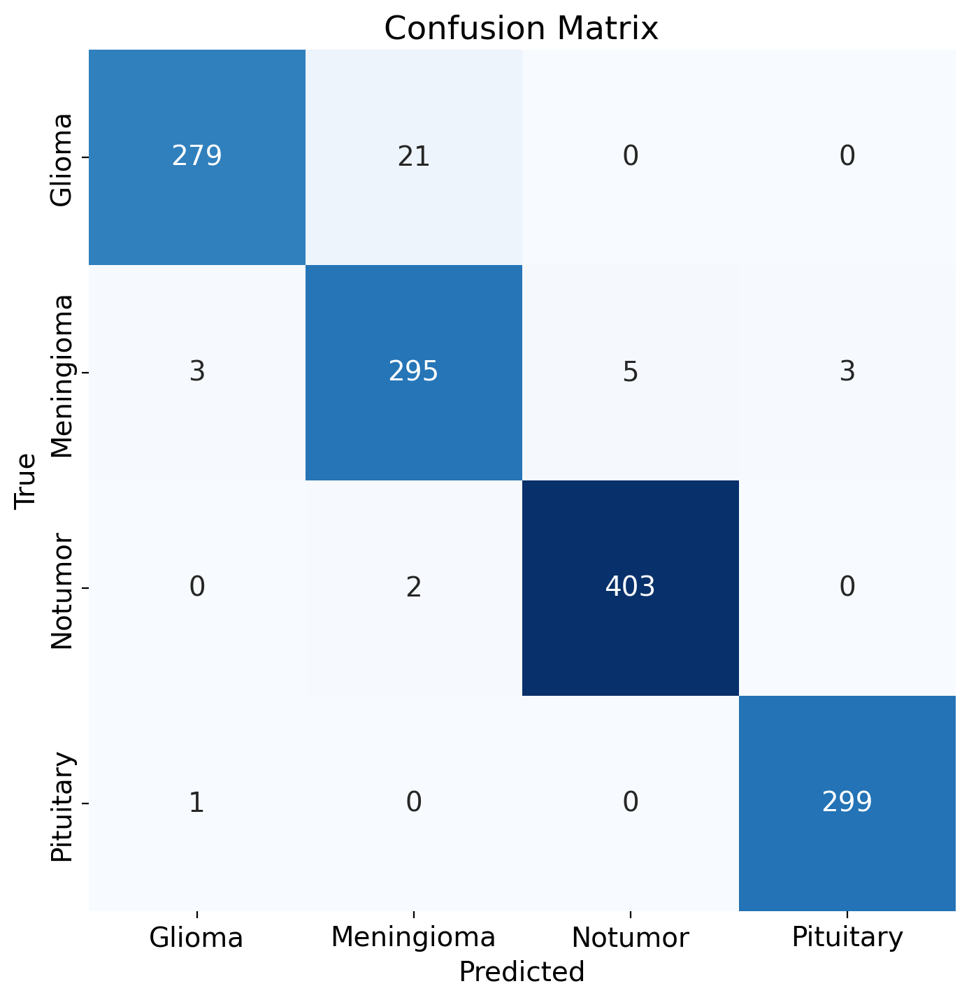

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step
Model saved in HDF5 format to /kaggle/working/model.h5


In [6]:

model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=2)
ax[0].plot(history.history['val_accuracy'], linewidth=2)
ax[0].set_title('Model 2 Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'])
ax[0].grid(alpha=0.2)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=2)
ax[1].plot(history.history['val_loss'], linewidth=2)
ax[1].set_title('Model 2 Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'])
ax[1].grid(alpha=0.2)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

model_save_path = '/kaggle/working/model.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

/opt/conda/lib/python3.10/site-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


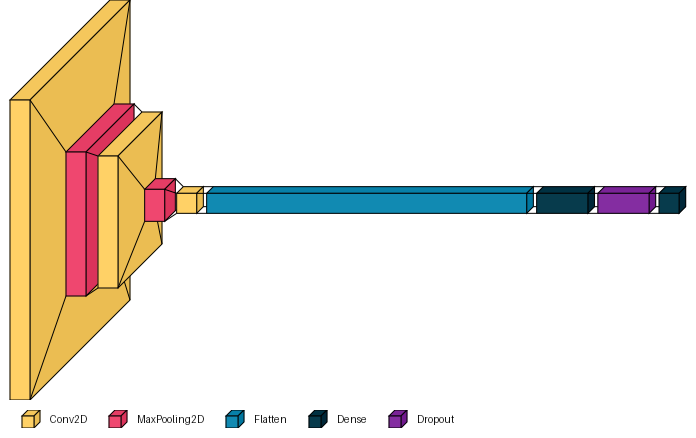

In [7]:
from visualkeras import layered_view
layered_view(model, legend=True, max_xy=300)

# Training batch size = 2

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_3 has kernel size: (4, 4)
Layer conv2d_4 has kernel size: (4, 4)
Layer conv2d_5 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


178/178 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.3621 - loss: 1.4421 - val_accuracy: 0.0000e+00 - val_loss: 1.2837 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.5304 - loss: 1.0505 - val_accuracy: 0.1000 - val_loss: 1.1368 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.7039 - loss: 0.7329 - val_accuracy: 0.3875 - val_loss: 1.0915 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.7322 - loss: 0.6995 - val_accuracy: 0.0875 - val_loss: 1.8466 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.6973 - loss: 0.7664 - val_accuracy: 0.0875 - val_loss: 3.4191 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.7245 - loss: 0.7547 - val_accuracy: 0.4500 - val_loss: 2.0182 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.7150 - loss: 0.6

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8147 - loss: 0.4808 - val_accuracy: 0.9355 - val_loss: 0.2239 - learning_rate: 5.0000e-04
Epoch 18/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8360 - loss: 0.4161 - val_accuracy: 0.8000 - val_loss: 0.3864 - learning_rate: 5.0000e-04
Epoch 19/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8551 - loss: 0.3589 - val_accuracy: 0.5125 - val_loss: 0.9328 - learning_rate: 5.0000e-04
Epoch 20/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8641 - loss: 0.3506 - val_accuracy: 0.3875 - val_loss: 1.2978 - learning_rate: 5.0000e-04
Epoch 21/128
177/178 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8535 - loss: 0.4155
Epoch 21: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8535 - loss: 0.4156 - val_accuracy: 0.1875 - val_loss: 1.9183 - learning_rate: 5.0000e-04
Epoch 22/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy:

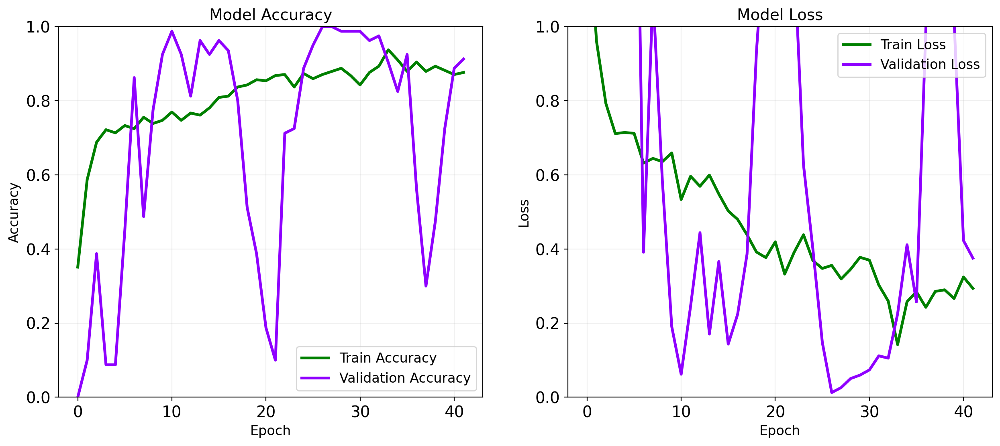

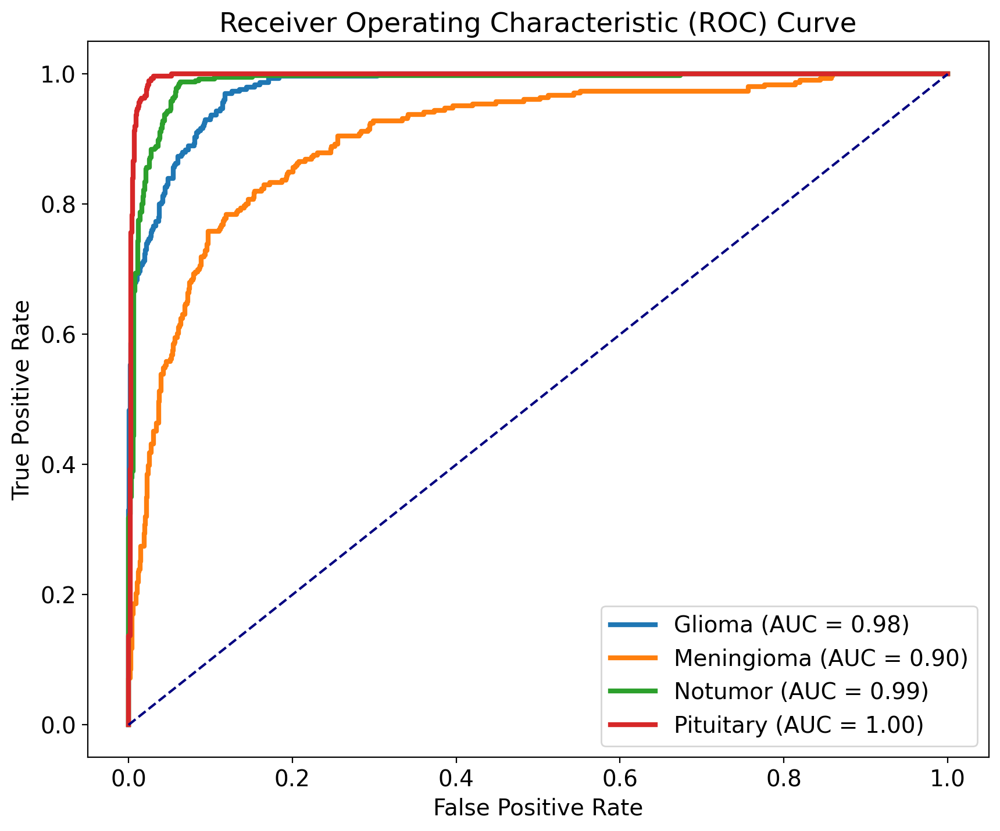

656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step


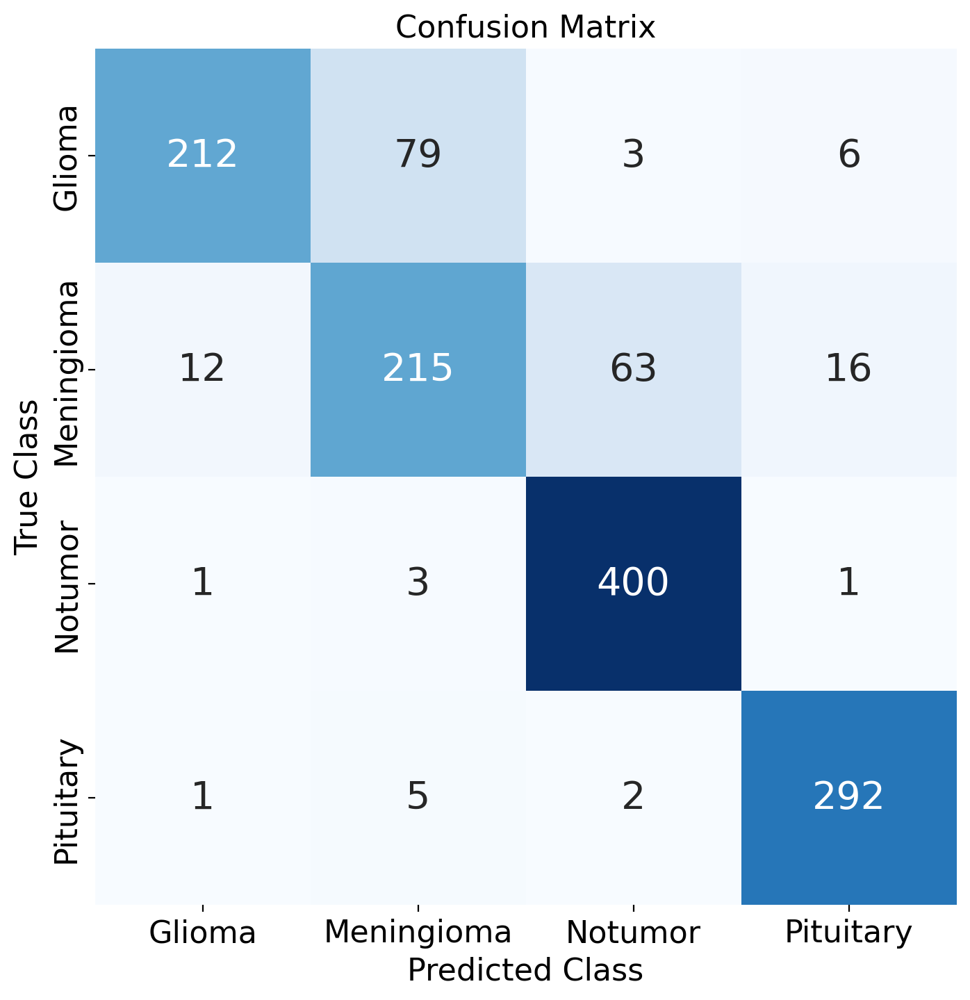

656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.938053  0.706667  0.806084       300
  Meningioma   0.711921  0.702614  0.707237       306
     Notumor   0.854701  0.987654  0.916380       405
   Pituitary   0.926984  0.973333  0.949593       300

    accuracy                       0.853547      1311
   macro avg   0.857915  0.842567  0.844824      1311
weighted avg   0.856989  0.853547  0.849925      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_2.h5


In [8]:
# Training batch size
batch_size = 2
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_2.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

# Training batch size = 4

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_6 has kernel size: (4, 4)
Layer conv2d_7 has kernel size: (4, 4)
Layer conv2d_8 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


178/178 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - accuracy: 0.3729 - loss: 1.3169 - val_accuracy: 0.9812 - val_loss: 0.5833 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.6676 - loss: 0.8143 - val_accuracy: 0.3812 - val_loss: 1.2394 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.7133 - loss: 0.6617 - val_accuracy: 0.2625 - val_loss: 2.1634 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - accuracy: 0.7291 - loss: 0.6640 - val_accuracy: 0.7312 - val_loss: 0.6424 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - accuracy: 0.7894 - loss: 0.5068 - val_accuracy: 0.9750 - val_loss: 0.0648 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - accuracy: 0.7967 - loss: 0.5392 - val_accuracy: 0.9250 - val_loss: 0.2501 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.7609 - loss: 0.6336

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7495 - loss: 0.8232 - val_accuracy: 0.9032 - val_loss: 0.3724 - learning_rate: 0.0010
Epoch 10/128
177/178 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.8059 - loss: 0.4987
Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.8059 - loss: 0.4984 - val_accuracy: 0.7188 - val_loss: 0.4991 - learning_rate: 0.0010
Epoch 11/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.8604 - loss: 0.3743 - val_accuracy: 0.3500 - val_loss: 1.4459 - learning_rate: 5.0000e-04
Epoch 12/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.9011 - loss: 0.3038 - val_accuracy: 0.4375 - val_loss: 1.3578 - learning_rate: 5.0000e-04
Epoch 13/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.8459 - loss: 0.3771 - val_accuracy: 0.8562 - val_loss: 0.4460 - learning_rate: 5.0000e-04
Epoch 14/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.8701 

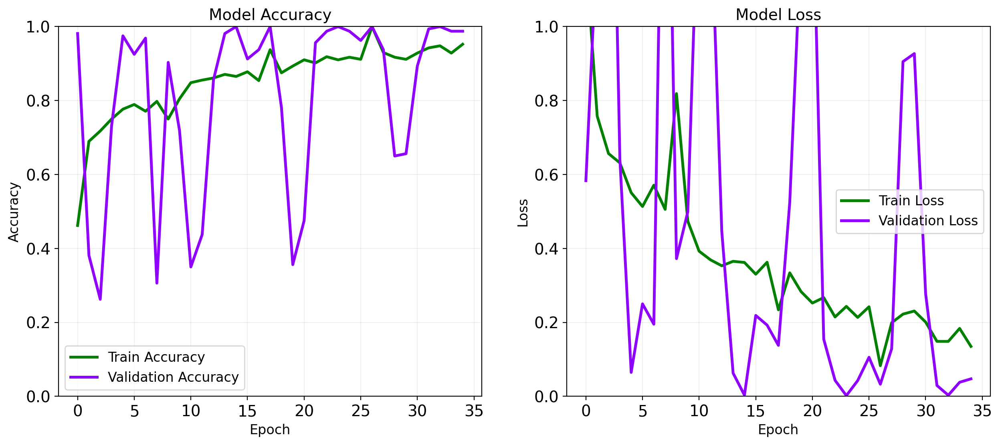

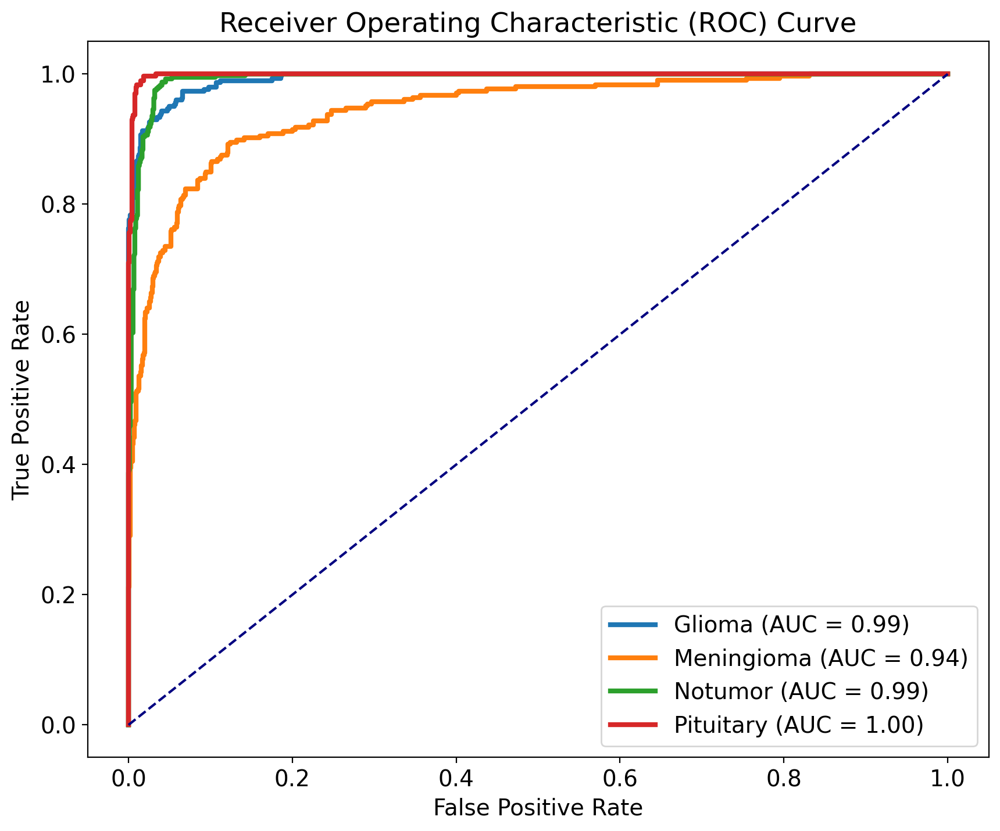

328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


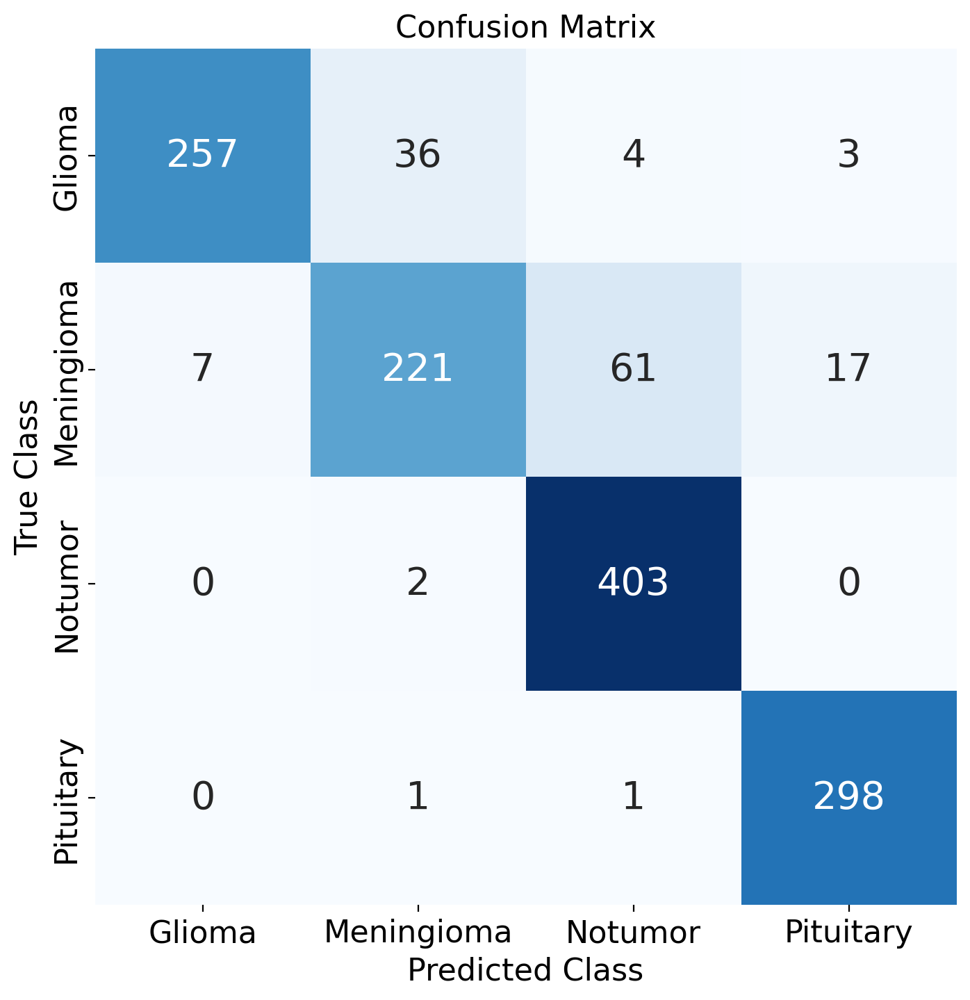

328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.973485  0.856667  0.911348       300
  Meningioma   0.850000  0.722222  0.780919       306
     Notumor   0.859275  0.995062  0.922197       405
   Pituitary   0.937107  0.993333  0.964401       300

    accuracy                       0.899314      1311
   macro avg   0.904967  0.891821  0.894716      1311
weighted avg   0.901056  0.899314  0.896396      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_4.h5


In [9]:
# Training batch size
batch_size = 4
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_4.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

# Training batch size = 8

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_9 has kernel size: (4, 4)
Layer conv2d_10 has kernel size: (4, 4)
Layer conv2d_11 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


178/178 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - accuracy: 0.4316 - loss: 1.1611 - val_accuracy: 0.8313 - val_loss: 0.6332 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.7129 - loss: 0.6935 - val_accuracy: 0.5562 - val_loss: 1.2709 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.7666 - loss: 0.5994 - val_accuracy: 0.9469 - val_loss: 0.2138 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.7695 - loss: 0.5582 - val_accuracy: 0.9969 - val_loss: 0.0347 - learning_rate: 0.0010
Epoch 5/128
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6250 - loss: 1.0618

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6871 - loss: 1.0252 - val_accuracy: 0.9677 - val_loss: 0.1214 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - accuracy: 0.7935 - loss: 0.4976 - val_accuracy: 0.6781 - val_loss: 0.6059 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.8342 - loss: 0.4452 - val_accuracy: 0.6562 - val_loss: 1.0680 - learning_rate: 0.0010
Epoch 8/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.8731 - loss: 0.3924 - val_accuracy: 0.9937 - val_loss: 0.0357 - learning_rate: 0.0010
Epoch 9/128
173/178 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8733 - loss: 0.3273
Epoch 9: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
178/178 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - accuracy: 0.8728 - loss: 0.3283 - val_accuracy: 0.9594 - val_loss: 0.1145 - learning_rate: 0.0010
Epoch 10/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - accuracy: 1.0000 - loss: 0.16

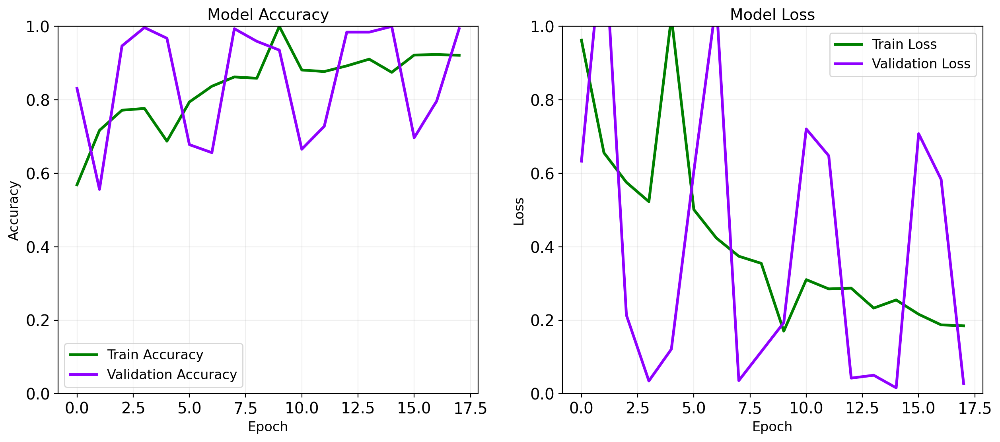

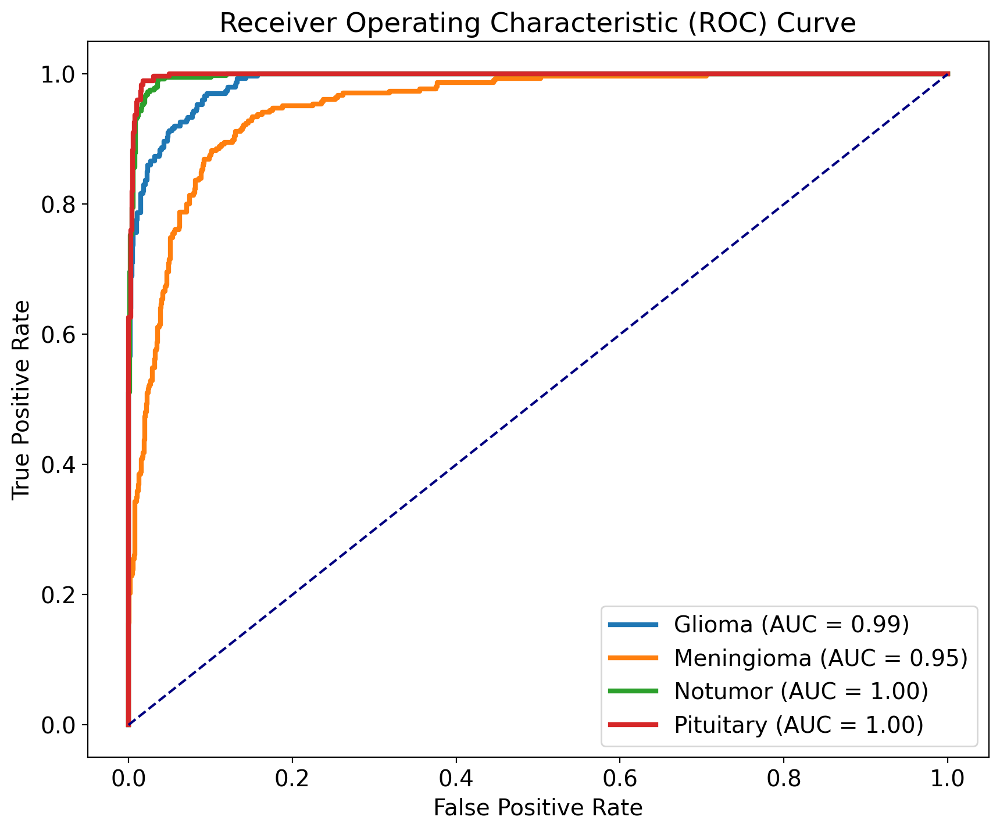

164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step


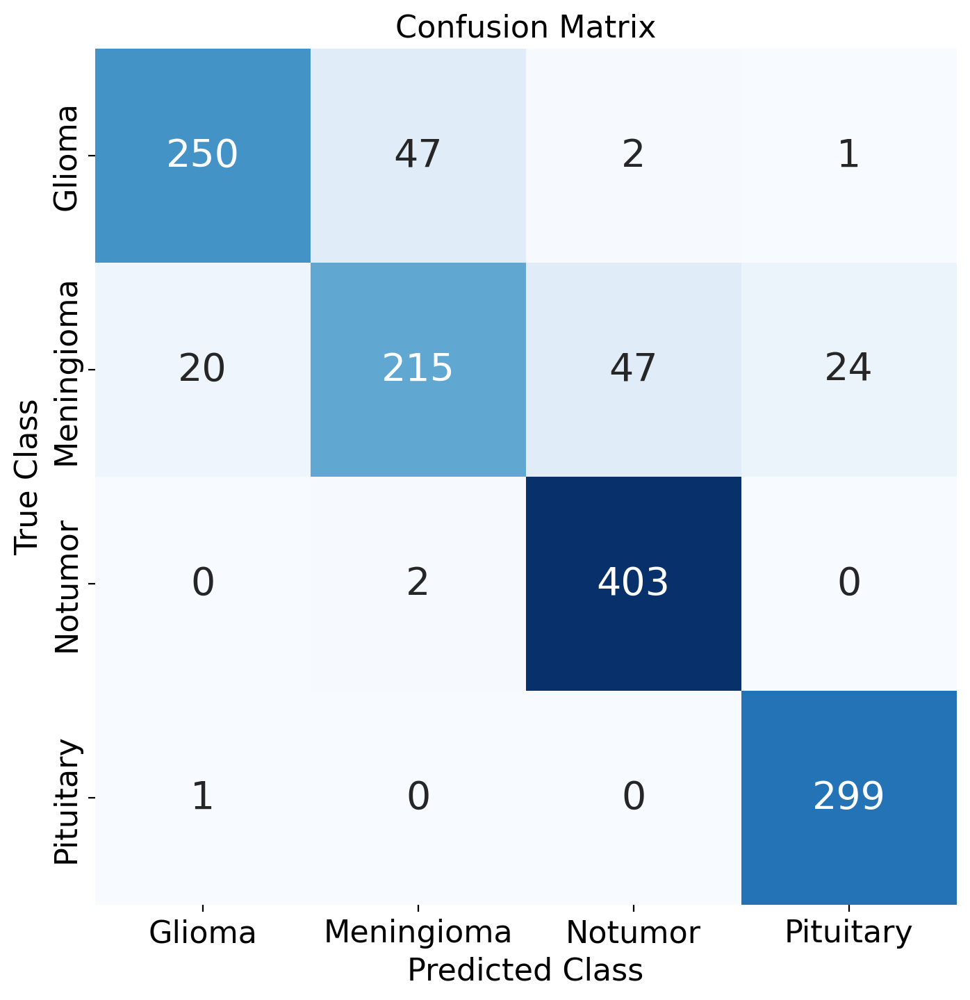

164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.922509  0.833333  0.875657       300
  Meningioma   0.814394  0.702614  0.754386       306
     Notumor   0.891593  0.995062  0.940490       405
   Pituitary   0.922840  0.996667  0.958333       300

    accuracy                       0.890160      1311
   macro avg   0.887834  0.881919  0.882217      1311
weighted avg   0.887799  0.890160  0.886299      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_8.h5


In [10]:
# Training batch size
batch_size = 8
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_8.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

# Training batch size = 16

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_12 has kernel size: (4, 4)
Layer conv2d_13 has kernel size: (4, 4)
Layer conv2d_14 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


178/178 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - accuracy: 0.5107 - loss: 1.0425 - val_accuracy: 0.5188 - val_loss: 1.1327 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - accuracy: 0.7622 - loss: 0.5808 - val_accuracy: 0.9297 - val_loss: 0.2498 - learning_rate: 0.0010
Epoch 3/128
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6875 - loss: 0.7802

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6875 - loss: 0.7802 - val_accuracy: 0.9677 - val_loss: 0.1446 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - accuracy: 0.7844 - loss: 0.5407 - val_accuracy: 0.5719 - val_loss: 1.1259 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - accuracy: 0.8301 - loss: 0.3965 - val_accuracy: 0.9422 - val_loss: 0.1946 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.7500 - loss: 0.5820 - val_accuracy: 0.8387 - val_loss: 0.4760 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - accuracy: 0.8355 - loss: 0.4412 - val_accuracy: 0.7047 - val_loss: 0.7082 - learning_rate: 0.0010
Epoch 8/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - accuracy: 0.8853 - loss: 0.3331 - val_accuracy: 0.9875 - val_loss: 0.0552 - learning_rate: 0.0010
Epoch 9/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - accuracy: 0.8750 - loss

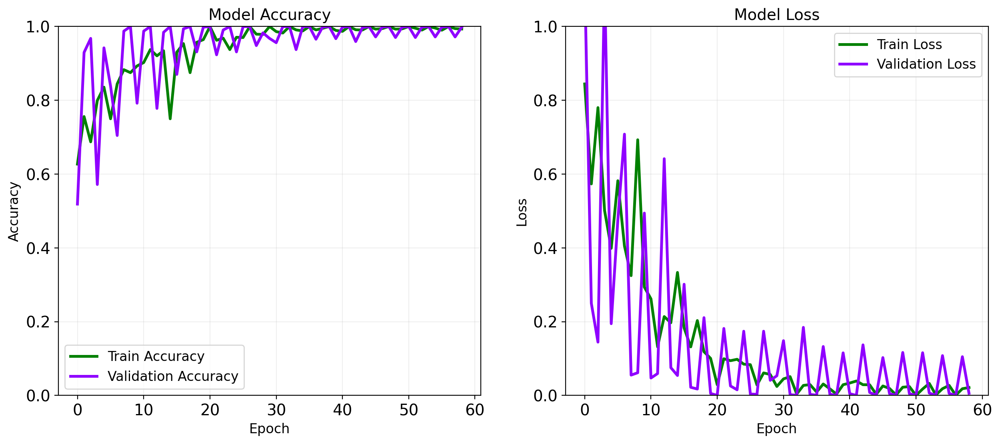

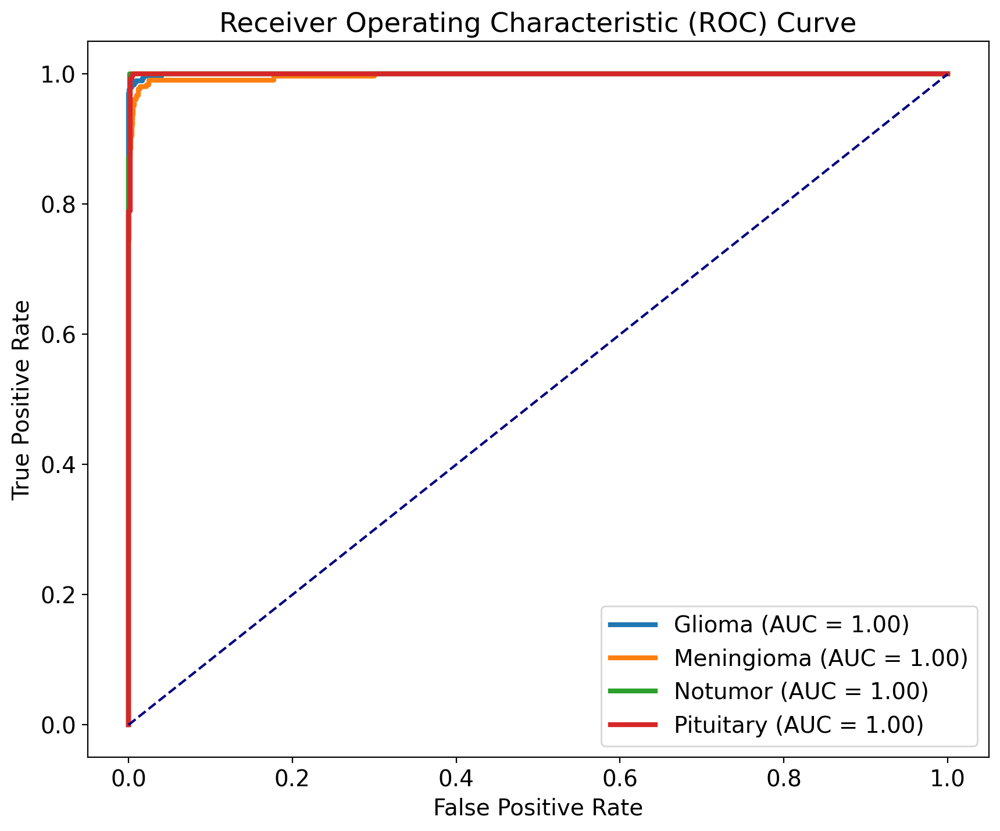

82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step


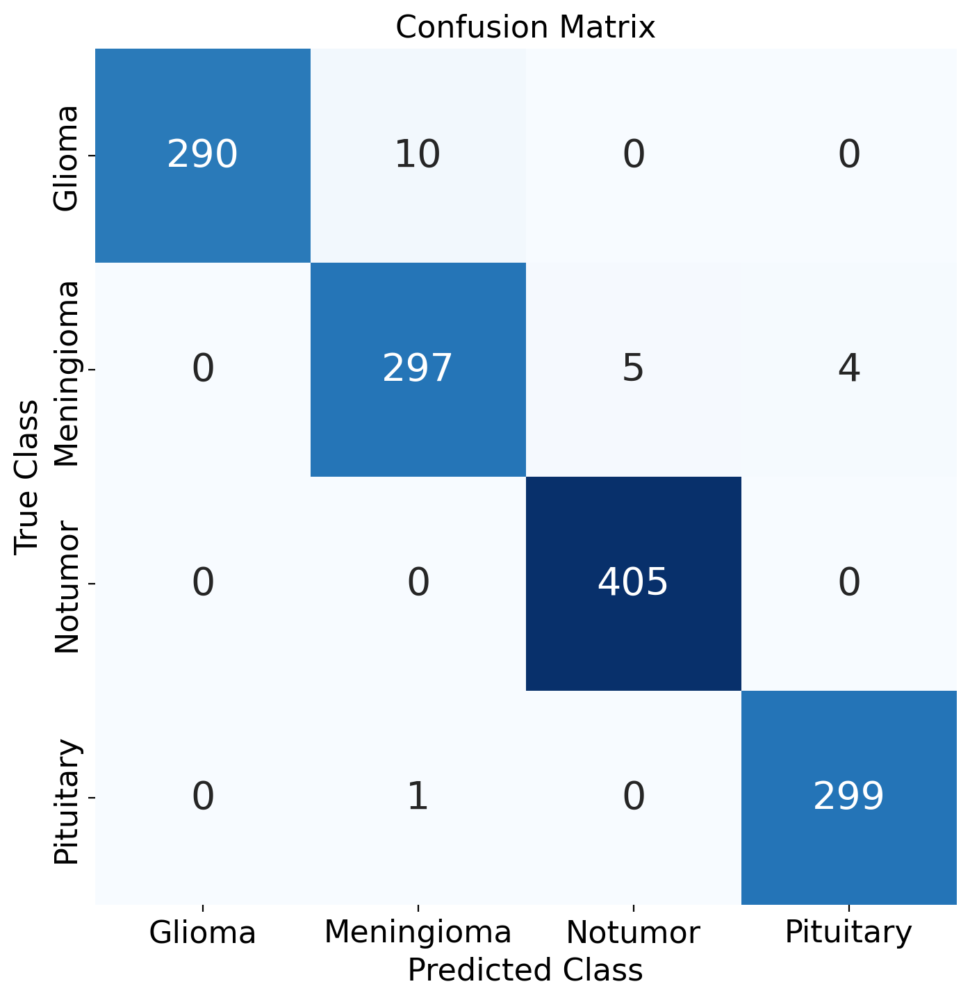

82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   1.000000  0.966667  0.983051       300
  Meningioma   0.964286  0.970588  0.967427       306
     Notumor   0.987805  1.000000  0.993865       405
   Pituitary   0.986799  0.996667  0.991708       300

    accuracy                       0.984744      1311
   macro avg   0.984722  0.983480  0.984013      1311
weighted avg   0.984876  0.984744  0.984726      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_16.h5


In [11]:
# Training batch size
batch_size = 16
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_16.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

# Training batch size = 32

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_15 has kernel size: (4, 4)
Layer conv2d_16 has kernel size: (4, 4)
Layer conv2d_17 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - accuracy: 0.5397 - loss: 0.9997 - val_accuracy: 0.7305 - val_loss: 0.6108 - learning_rate: 0.0010
Epoch 2/128
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6875 - loss: 0.6455

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6875 - loss: 0.6455 - val_accuracy: 0.9032 - val_loss: 0.3811 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - accuracy: 0.7746 - loss: 0.5444 - val_accuracy: 0.7688 - val_loss: 0.6684 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - accuracy: 0.6250 - loss: 0.5999 - val_accuracy: 0.9032 - val_loss: 0.2400 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - accuracy: 0.8223 - loss: 0.4385 - val_accuracy: 0.7547 - val_loss: 0.6149 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - accuracy: 0.8438 - loss: 0.3867 - val_accuracy: 0.7742 - val_loss: 0.6377 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - accuracy: 0.8604 - loss: 0.3557 - val_accuracy: 0.8328 - val_loss: 0.4424 - learning_rate: 0.0010
Epoch 8/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - accuracy: 0.9062 - loss:

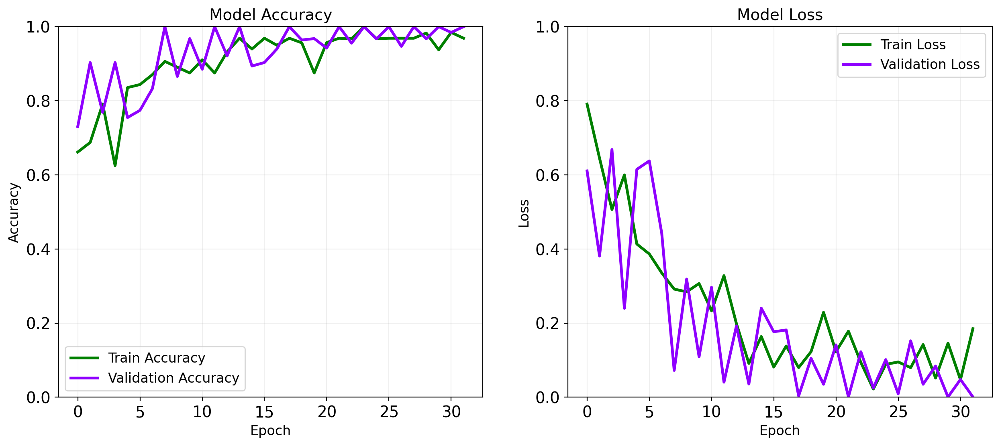

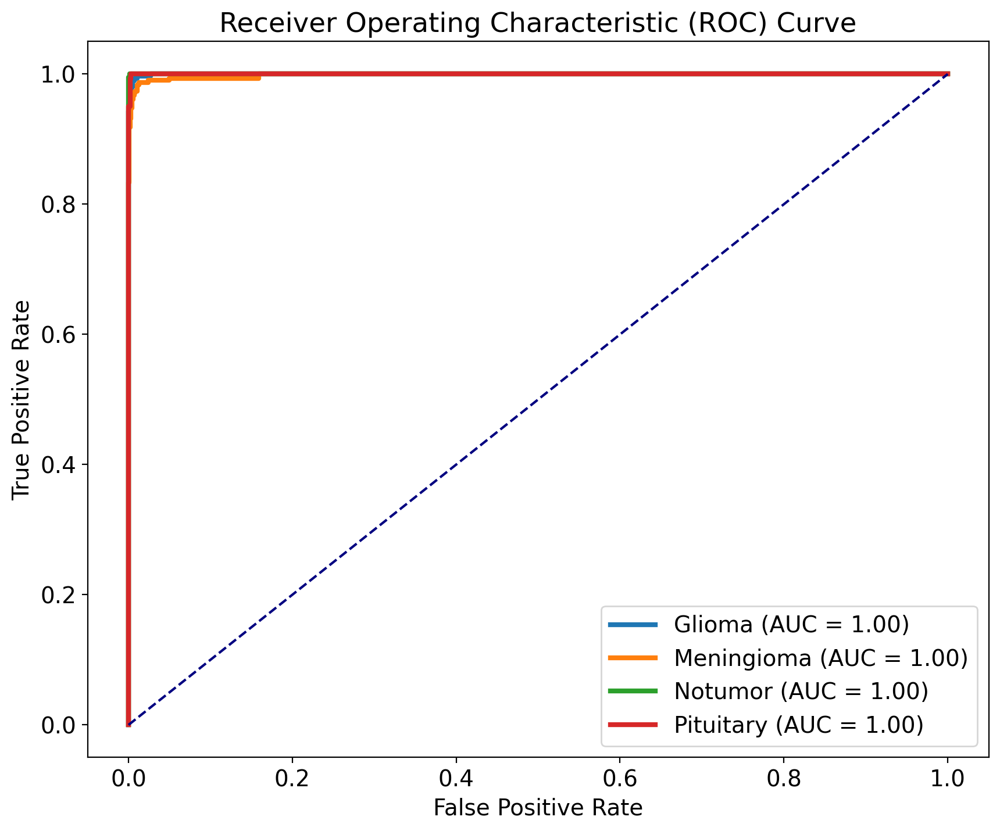

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step


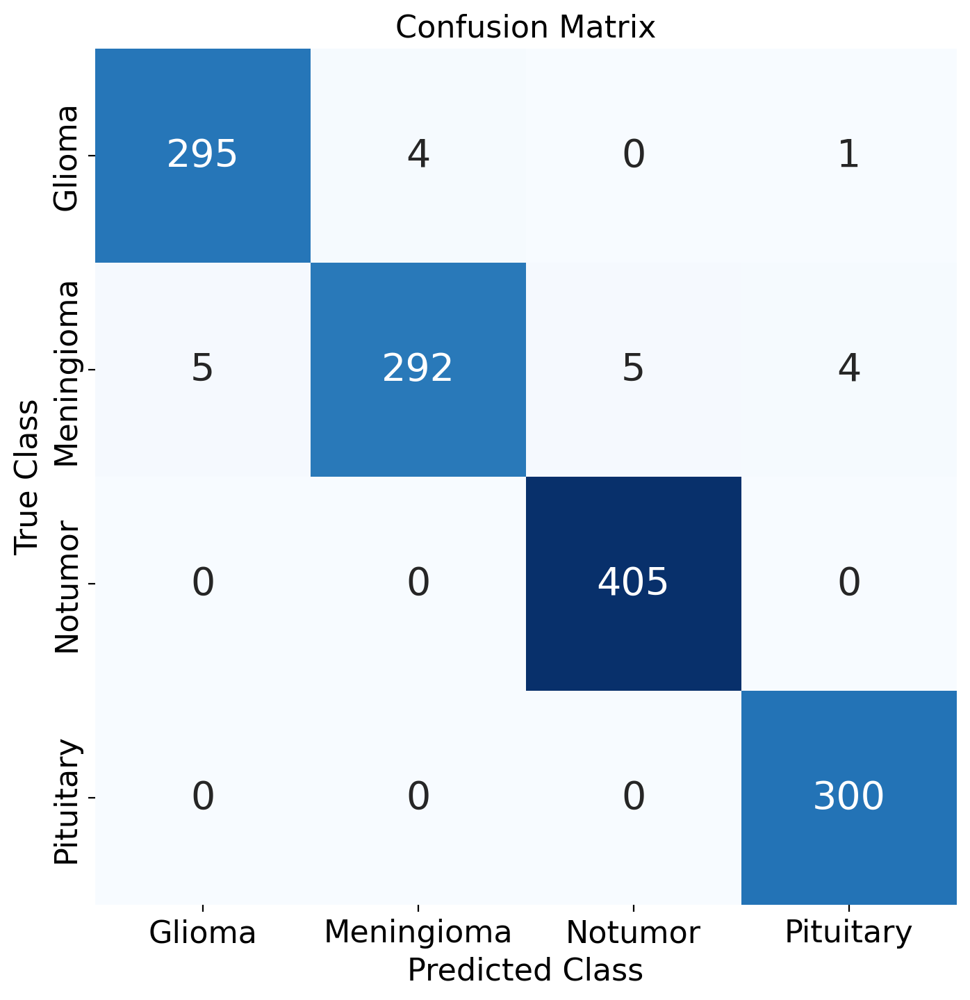

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.983333  0.983333  0.983333       300
  Meningioma   0.986486  0.954248  0.970100       306
     Notumor   0.987805  1.000000  0.993865       405
   Pituitary   0.983607  1.000000  0.991736       300

    accuracy                       0.985507      1311
   macro avg   0.985308  0.984395  0.984758      1311
weighted avg   0.985513  0.985507  0.985421      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_32.h5


In [12]:
# Training batch size
batch_size = 32
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_32.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

# Training batch size = 64

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_18 has kernel size: (4, 4)
Layer conv2d_19 has kernel size: (4, 4)
Layer conv2d_20 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 87/178 ━━━━━━━━━━━━━━━━━━━━ 41s 453ms/step - accuracy: 0.5064 - loss: 1.0449

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - accuracy: 0.5724 - loss: 0.9409 - val_accuracy: 0.7346 - val_loss: 0.7027 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - accuracy: 0.7655 - loss: 0.5723 - val_accuracy: 0.7635 - val_loss: 0.6121 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - accuracy: 0.8109 - loss: 0.4668 - val_accuracy: 0.7910 - val_loss: 0.5114 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 227ms/step - accuracy: 0.8558 - loss: 0.3697 - val_accuracy: 0.8009 - val_loss: 0.4742 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 224ms/step - accuracy: 0.8697 - loss: 0.3433 - val_accuracy: 0.8330 - val_loss: 0.4383 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - accuracy: 0.9023 - loss: 0.2623 - val_accuracy: 0.8795 - val_loss: 0.2817 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 229ms/step - accuracy: 0.9146 -

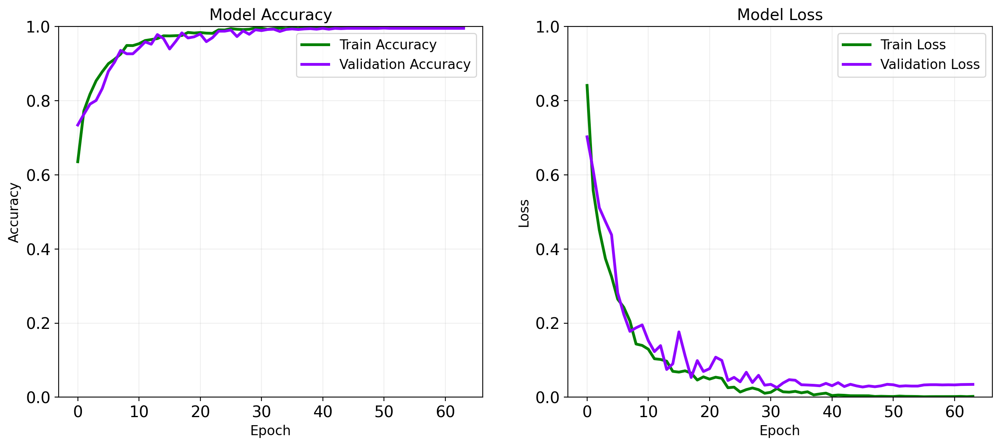

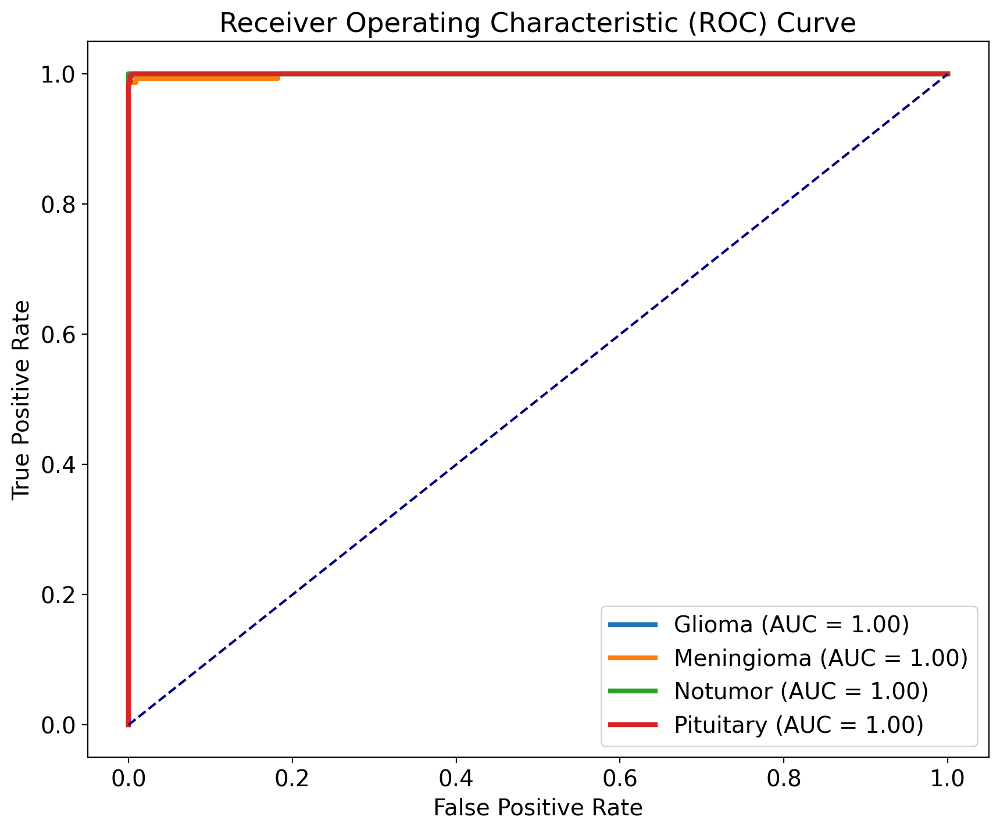

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step


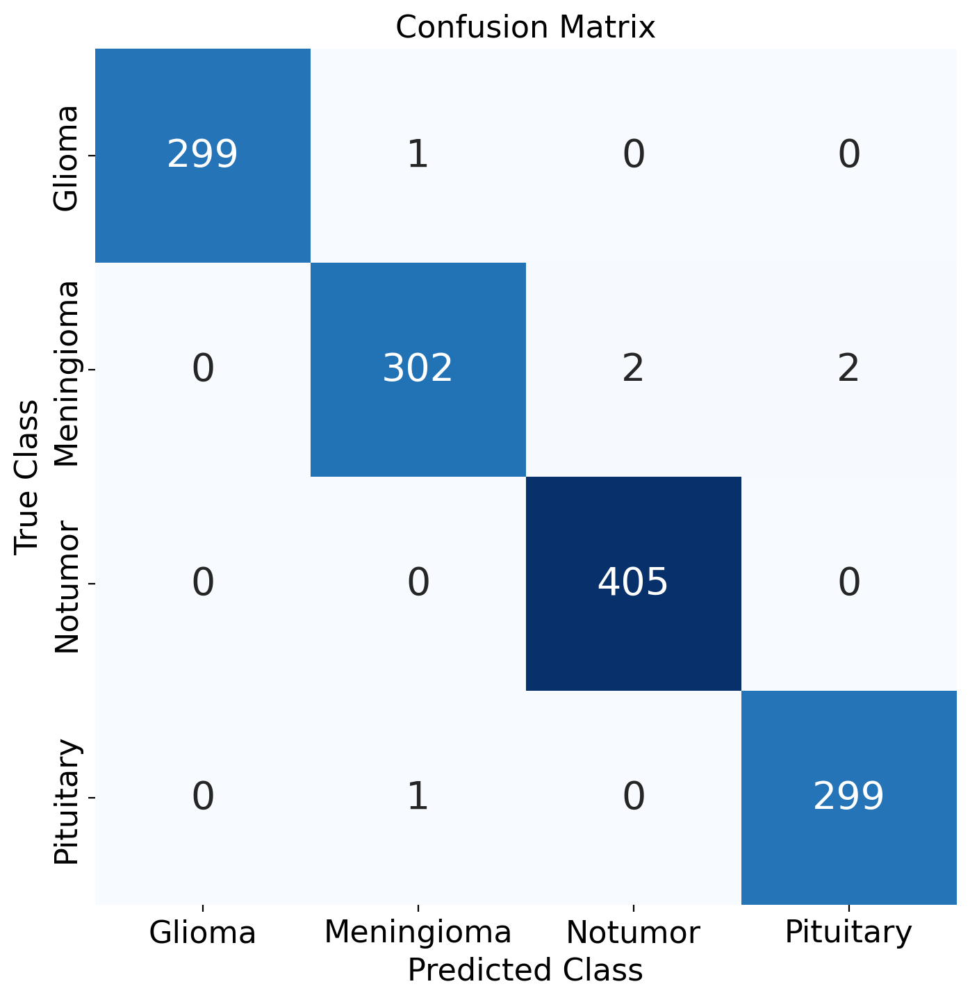

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   1.000000  0.996667  0.998331       300
  Meningioma   0.993421  0.986928  0.990164       306
     Notumor   0.995086  1.000000  0.997537       405
   Pituitary   0.993355  0.996667  0.995008       300

    accuracy                       0.995423      1311
   macro avg   0.995466  0.995065  0.995260      1311
weighted avg   0.995426  0.995423  0.995419      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_64.h5


In [13]:
# Training batch size
batch_size = 64
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_64.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


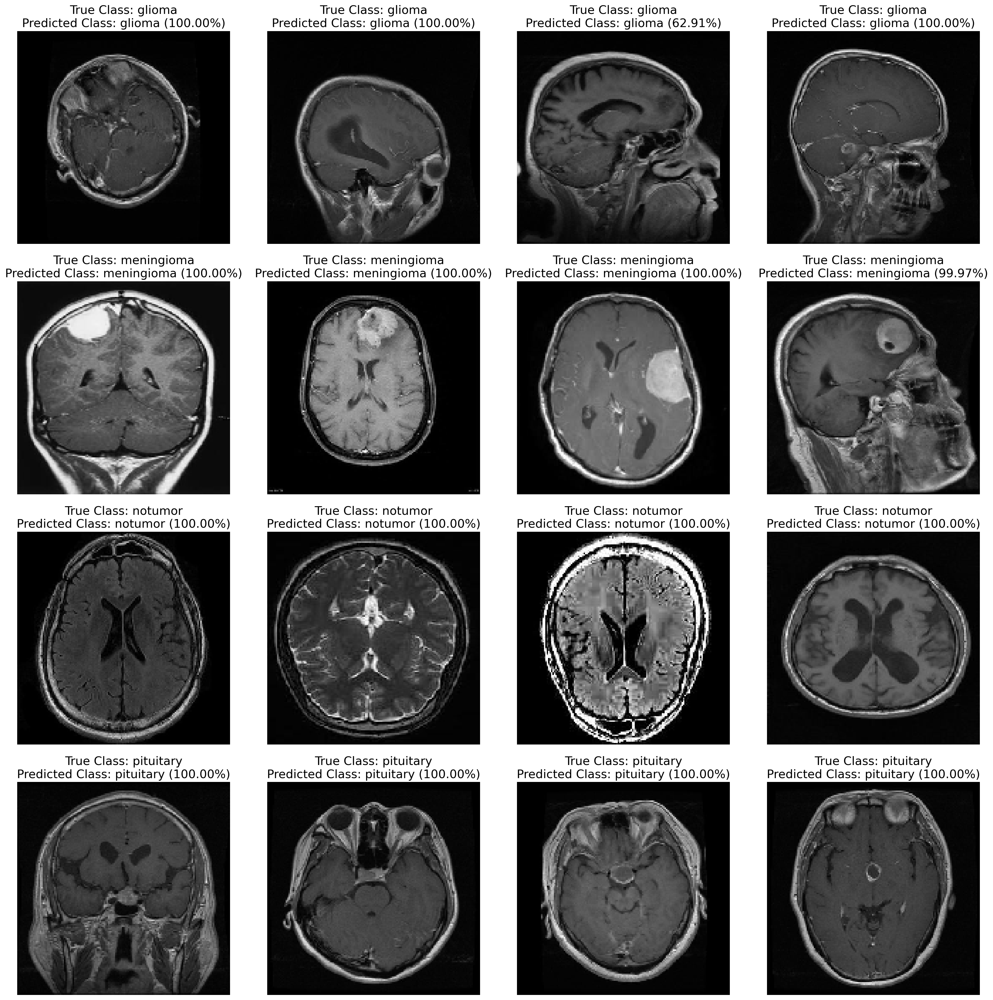

In [14]:
# Function to predict and plot 4 sample images from each class
def predict_and_plot_samples(test_path, class_names, num_samples=4):
    fig, axes = plt.subplots(len(class_names), num_samples, figsize=(20, len(class_names) * 5))  # Create subplots

    for i, class_name in enumerate(class_names):
        # Get the list of images in the selected subclass
        class_dir = os.path.join(test_path, class_name)
        images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

        # If there are not enough images, raise an error
        if len(images) < num_samples:
            raise ValueError(f"Not enough images found in directory {class_dir} for class {class_name}")

        # Select random images
        random_images = random.sample(images, num_samples)

        for j, random_image in enumerate(random_images):
            image_path = os.path.join(class_dir, random_image)

            # Load and preprocess the image
            img = load_img(image_path, target_size=(150, 150))
            img_array = img_to_array(img) / 255.0  # Rescale to [0, 1]
            img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

            # Predict the class
            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions, axis=1)[0]
            predicted_class_name = class_names[predicted_class]
            prediction_percentage = np.max(predictions) * 100

            # Get the true class
            true_class_index = test_generator.class_indices[class_name]
            true_class_name = class_names[true_class_index]

            # Display the image and prediction results
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"True Class: {true_class_name}\nPredicted Class: {predicted_class_name} ({prediction_percentage:.2f}%)")
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Predict and display results for 4 images from each class
predict_and_plot_samples(test_dir, class_names)

In [15]:
import csv
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define datasets
datasets = {
    "Dataset 1": "/kaggle/input/labeled-mri-brain-tumor-dataset/Brain Tumor labeled dataset",
    "Dataset 2": "/kaggle/input/mri-brain-tumor-cleaned/brain_tumor_cleaned/Training",
    "Dataset 3": "/kaggle/input/code-to-cure/Training",
    "Dataset4": "/kaggle/input/mri-brain-tumor-classification/MRI/Training",
    "Dataset5": "/kaggle/input/brain-tumor-mri-dataset-final/Training",
}

# Function to evaluate model on a given dataset
def evaluate_on_dataset(dataset_name, dataset_path, model, image_size=(150, 150), batch_size=32):
    # Load test data
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        dataset_path,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Get true labels and predictions
    y_true = test_generator.classes
    y_pred_proba = model.predict(test_generator)
    y_pred = np.argmax(y_pred_proba, axis=1)

    # Generate classification report
    class_labels = list(test_generator.class_indices.keys())
    report = classification_report(y_true, y_pred, target_names=class_labels, digits=6, output_dict=True)
    accuracy = report['accuracy']
    macro_avg = report['macro avg']
    weighted_avg = report['weighted avg']

    # Display the classification report
    print(f"\nClassification Report for {dataset_name}:\n")
    print(classification_report(y_true, y_pred, target_names=class_labels, digits=6))

    # Return consolidated results
    return {
        "Dataset": dataset_name,
        "Accuracy": accuracy,
        "Macro Average Precision": macro_avg["precision"],
        "Macro Average Recall": macro_avg["recall"],
        "Macro Average F1-Score": macro_avg["f1-score"],
        "Weighted Average Precision": weighted_avg["precision"],
        "Weighted Average Recall": weighted_avg["recall"],
        "Weighted Average F1-Score": weighted_avg["f1-score"],
    }

# Consolidate results for all datasets
results = []
for dataset_name, dataset_path in datasets.items():
    print(f"Evaluating on {dataset_name}...")
    metrics = evaluate_on_dataset(dataset_name, dataset_path, model)
    results.append(metrics)

# Save results to CSV
csv_file = "evaluation_results.csv"
csv_columns = list(results[0].keys())

with open(csv_file, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=csv_columns)
    writer.writeheader()
    writer.writerows(results)

# Display results in tabular format
df = pd.DataFrame(results)
print(df)

# Save 
df.to_csv('df64.csv', index=False)
print("DataFrame saved ")

Evaluating on Dataset 1...
Found 2175 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


68/68 ━━━━━━━━━━━━━━━━━━━━ 12s 171ms/step

Classification Report for Dataset 1:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000       455
  meningioma   0.996377  1.000000  0.998185       550
     notumor   1.000000  1.000000  1.000000       550
   pituitary   1.000000  0.996774  0.998384       620

    accuracy                       0.999080      2175
   macro avg   0.999094  0.999194  0.999142      2175
weighted avg   0.999084  0.999080  0.999081      2175

Evaluating on Dataset 2...
Found 5099 images belonging to 4 classes.
  2/160 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 29s 182ms/step

Classification Report for Dataset 2:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000      1321
  meningioma   0.998459  0.998459  0.998459      1298
     notumor   1.000000  1.000000  1.000000      1041
   pituitary   0.998610  0.998610  0.998610      1439

    accuracy                       0.999216      5099
   macro avg   0.999267  0.999267  0.999267      5099
weighted avg   0.999216  0.999216  0.999216      5099

Evaluating on Dataset 3...
Found 5229 images belonging to 4 classes.
  2/164 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


164/164 ━━━━━━━━━━━━━━━━━━━━ 30s 182ms/step

Classification Report for Dataset 3:

              precision    recall  f1-score   support

      glioma   0.998359  1.000000  0.999179      1217
  meningioma   0.999173  0.997523  0.998347      1211
     notumor   1.000000  1.000000  1.000000      1463
   pituitary   0.999253  0.999253  0.999253      1338

    accuracy                       0.999235      5229
   macro avg   0.999196  0.999194  0.999195      5229
weighted avg   0.999235  0.999235  0.999235      5229

Evaluating on Dataset4...
Found 5708 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 31s 175ms/step

Classification Report for Dataset4:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000      1321
  meningioma   0.998506  0.998506  0.998506      1339
     notumor   1.000000  1.000000  1.000000      1591
   pituitary   0.998627  0.998627  0.998627      1457

    accuracy                       0.999299      5708
   macro avg   0.999283  0.999283  0.999283      5708
weighted avg   0.999299  0.999299  0.999299      5708

Evaluating on Dataset5...
Found 5712 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 32s 180ms/step

Classification Report for Dataset5:

                  precision    recall  f1-score   support

    glioma_tumor   1.000000  1.000000  1.000000      1321
meningioma_tumor   0.998506  0.998506  0.998506      1339
        no_tumor   1.000000  1.000000  1.000000      1595
 pituitary_tumor   0.998627  0.998627  0.998627      1457

        accuracy                       0.999300      5712
       macro avg   0.999283  0.999283  0.999283      5712
    weighted avg   0.999300  0.999300  0.999300      5712

     Dataset  Accuracy  Macro Average Precision  Macro Average Recall  \
0  Dataset 1  0.999080                 0.999094              0.999194   
1  Dataset 2  0.999216                 0.999267              0.999267   
2  Dataset 3  0.999235                 0.999196              0.999194   
3   Dataset4  0.999299                 0.999283              0.999283   
4   Dataset5  0.999300                 0.999283              0.999283   

   Macro Ave

# Training batch size = 128

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_21 has kernel size: (4, 4)
Layer conv2d_22 has kernel size: (4, 4)
Layer conv2d_23 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 44/178 ━━━━━━━━━━━━━━━━━━━━ 1:49 814ms/step - accuracy: 0.4829 - loss: 1.1307

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 51s 220ms/step - accuracy: 0.5669 - loss: 0.9808 - val_accuracy: 0.6163 - val_loss: 0.9014 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 219ms/step - accuracy: 0.7462 - loss: 0.6323 - val_accuracy: 0.7681 - val_loss: 0.5941 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - accuracy: 0.8112 - loss: 0.4888 - val_accuracy: 0.7574 - val_loss: 0.6027 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 46s 218ms/step - accuracy: 0.8316 - loss: 0.4311 - val_accuracy: 0.7925 - val_loss: 0.4961 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 46s 217ms/step - accuracy: 0.8423 - loss: 0.3902 - val_accuracy: 0.8261 - val_loss: 0.4559 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 45s 214ms/step - accuracy: 0.8702 - loss: 0.3279 - val_accuracy: 0.8551 - val_loss: 0.3662 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 45s 215ms/step - accuracy: 0.8926 -

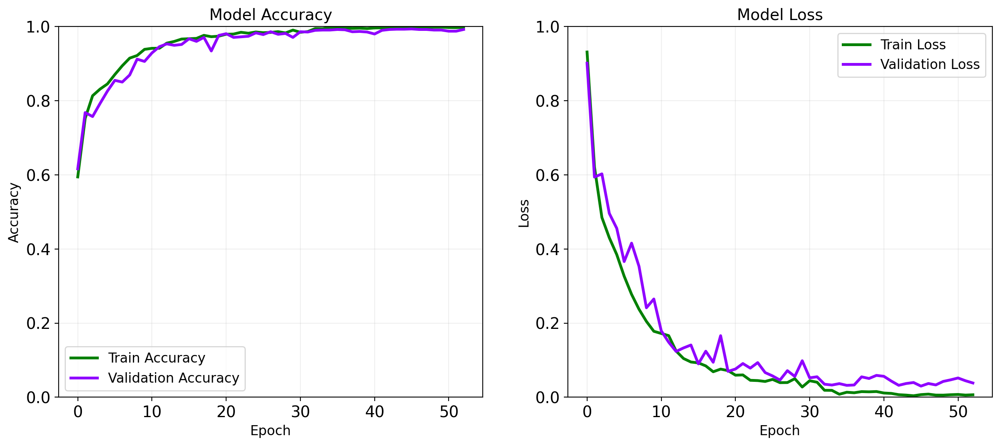

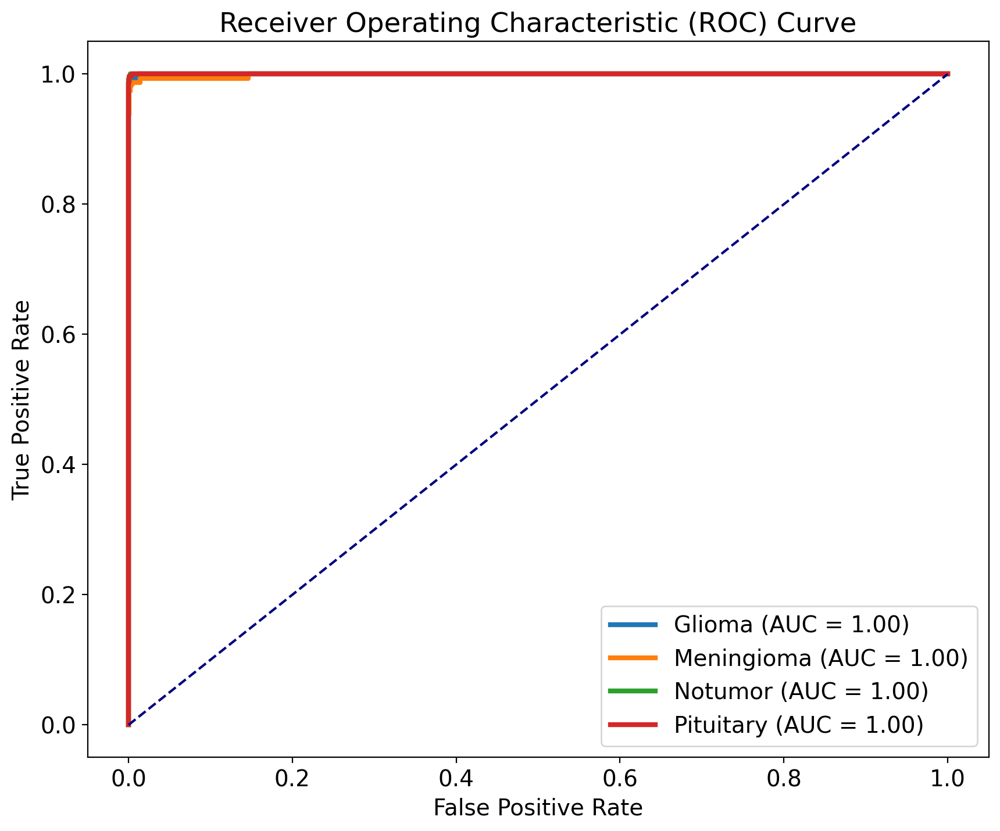

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step


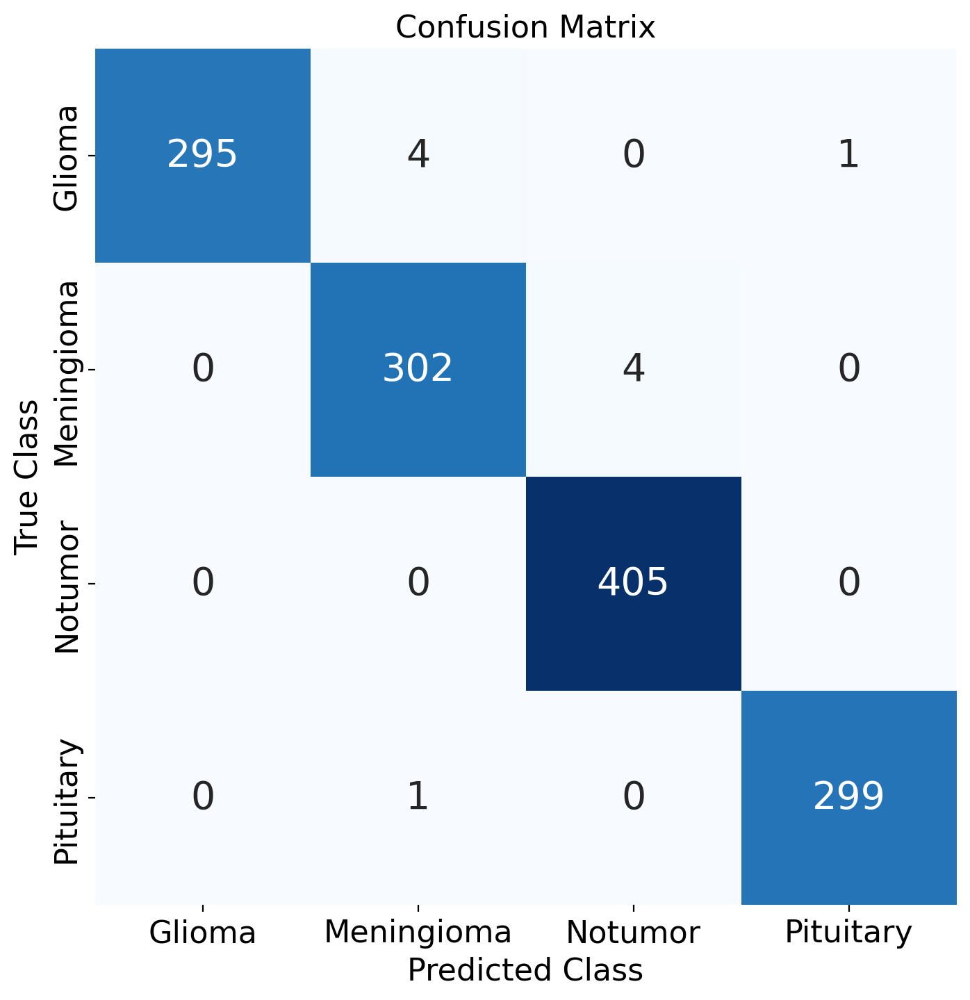

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   1.000000  0.983333  0.991597       300
  Meningioma   0.983713  0.986928  0.985318       306
     Notumor   0.990220  1.000000  0.995086       405
   Pituitary   0.996667  0.996667  0.996667       300

    accuracy                       0.992372      1311
   macro avg   0.992650  0.991732  0.992167      1311
weighted avg   0.992414  0.992372  0.992369      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_128.h5


In [16]:
# Training batch size
batch_size = 128
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Class", fontsize=16)
plt.ylabel("True Class", fontsize=16)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_128.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


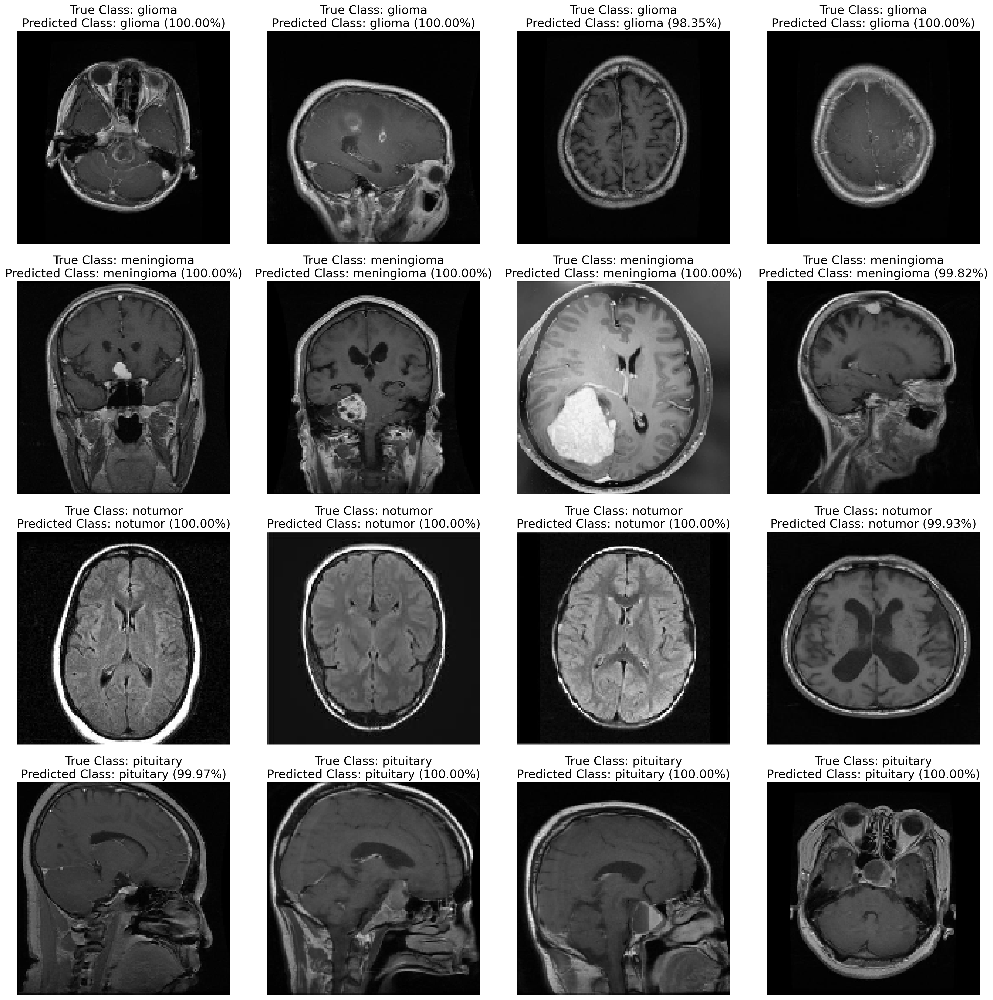

In [17]:
# Function to predict and plot 4 sample images from each class
def predict_and_plot_samples(test_path, class_names, num_samples=4):
    fig, axes = plt.subplots(len(class_names), num_samples, figsize=(20, len(class_names) * 5))  # Create subplots

    for i, class_name in enumerate(class_names):
        # Get the list of images in the selected subclass
        class_dir = os.path.join(test_path, class_name)
        images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

        # If there are not enough images, raise an error
        if len(images) < num_samples:
            raise ValueError(f"Not enough images found in directory {class_dir} for class {class_name}")

        # Select random images
        random_images = random.sample(images, num_samples)

        for j, random_image in enumerate(random_images):
            image_path = os.path.join(class_dir, random_image)

            # Load and preprocess the image
            img = load_img(image_path, target_size=(150, 150))
            img_array = img_to_array(img) / 255.0  # Rescale to [0, 1]
            img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

            # Predict the class
            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions, axis=1)[0]
            predicted_class_name = class_names[predicted_class]
            prediction_percentage = np.max(predictions) * 100

            # Get the true class
            true_class_index = test_generator.class_indices[class_name]
            true_class_name = class_names[true_class_index]

            # Display the image and prediction results
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"True Class: {true_class_name}\nPredicted Class: {predicted_class_name} ({prediction_percentage:.2f}%)")
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Predict and display results for 4 images from each class
predict_and_plot_samples(test_dir, class_names)

In [18]:
import csv
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define datasets
datasets = {
    "Dataset 1": "/kaggle/input/labeled-mri-brain-tumor-dataset/Brain Tumor labeled dataset",
    "Dataset 2": "/kaggle/input/mri-brain-tumor-cleaned/brain_tumor_cleaned/Training",
    "Dataset 3": "/kaggle/input/code-to-cure/Training",
    "Dataset 4": "/kaggle/input/mri-brain-tumor-classification/MRI/Training",
    "Dataset 5": "/kaggle/input/brain-tumor-mri-dataset-final/Training",
}

# Function to evaluate model on a given dataset
def evaluate_on_dataset(dataset_name, dataset_path, model, image_size=(150, 150), batch_size=32):
    # Load test data
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        dataset_path,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Get true labels and predictions
    y_true = test_generator.classes
    y_pred_proba = model.predict(test_generator)
    y_pred = np.argmax(y_pred_proba, axis=1)

    # Generate classification report
    class_labels = list(test_generator.class_indices.keys())
    report = classification_report(y_true, y_pred, target_names=class_labels, digits=6, output_dict=True)
    accuracy = report['accuracy']
    macro_avg = report['macro avg']
    weighted_avg = report['weighted avg']

    # Display the classification report
    print(f"\nClassification Report for {dataset_name}:\n")
    print(classification_report(y_true, y_pred, target_names=class_labels, digits=6))

    # Return consolidated results
    return {
        "Dataset": dataset_name,
        "Accuracy": accuracy,
        "Macro Average Precision": macro_avg["precision"],
        "Macro Average Recall": macro_avg["recall"],
        "Macro Average F1-Score": macro_avg["f1-score"],
        "Weighted Average Precision": weighted_avg["precision"],
        "Weighted Average Recall": weighted_avg["recall"],
        "Weighted Average F1-Score": weighted_avg["f1-score"],
    }

# Consolidate results for all datasets
results = []
for dataset_name, dataset_path in datasets.items():
    print(f"Evaluating on {dataset_name}...")
    metrics = evaluate_on_dataset(dataset_name, dataset_path, model)
    results.append(metrics)

# Save results to CSV
csv_file = "evaluation_results.csv"
csv_columns = list(results[0].keys())

with open(csv_file, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=csv_columns)
    writer.writeheader()
    writer.writerows(results)

# Display results in tabular format
df = pd.DataFrame(results)
print(df)

# Save 
df.to_csv('df128.csv', index=False)
print("DataFrame saved ")

Evaluating on Dataset 1...
Found 2175 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step

Classification Report for Dataset 1:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000       455
  meningioma   0.998185  1.000000  0.999092       550
     notumor   1.000000  1.000000  1.000000       550
   pituitary   1.000000  0.998387  0.999193       620

    accuracy                       0.999540      2175
   macro avg   0.999546  0.999597  0.999571      2175
weighted avg   0.999541  0.999540  0.999540      2175

Evaluating on Dataset 2...
Found 5099 images belonging to 4 classes.
  2/160 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step

Classification Report for Dataset 2:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000      1321
  meningioma   0.998459  0.998459  0.998459      1298
     notumor   1.000000  1.000000  1.000000      1041
   pituitary   0.998610  0.998610  0.998610      1439

    accuracy                       0.999216      5099
   macro avg   0.999267  0.999267  0.999267      5099
weighted avg   0.999216  0.999216  0.999216      5099

Evaluating on Dataset 3...
Found 5229 images belonging to 4 classes.
  2/164 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


164/164 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step

Classification Report for Dataset 3:

              precision    recall  f1-score   support

      glioma   0.998359  1.000000  0.999179      1217
  meningioma   0.998346  0.996697  0.997521      1211
     notumor   0.998635  1.000000  0.999317      1463
   pituitary   0.999251  0.997758  0.998504      1338

    accuracy                       0.998661      5229
   macro avg   0.998648  0.998614  0.998630      5229
weighted avg   0.998662  0.998661  0.998661      5229

Evaluating on Dataset 4...
Found 5708 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step

Classification Report for Dataset 4:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000      1321
  meningioma   0.998506  0.998506  0.998506      1339
     notumor   1.000000  1.000000  1.000000      1591
   pituitary   0.998627  0.998627  0.998627      1457

    accuracy                       0.999299      5708
   macro avg   0.999283  0.999283  0.999283      5708
weighted avg   0.999299  0.999299  0.999299      5708

Evaluating on Dataset 5...
Found 5712 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step

Classification Report for Dataset 5:

                  precision    recall  f1-score   support

    glioma_tumor   1.000000  1.000000  1.000000      1321
meningioma_tumor   0.998506  0.998506  0.998506      1339
        no_tumor   1.000000  1.000000  1.000000      1595
 pituitary_tumor   0.998627  0.998627  0.998627      1457

        accuracy                       0.999300      5712
       macro avg   0.999283  0.999283  0.999283      5712
    weighted avg   0.999300  0.999300  0.999300      5712

     Dataset  Accuracy  Macro Average Precision  Macro Average Recall  \
0  Dataset 1  0.999540                 0.999546              0.999597   
1  Dataset 2  0.999216                 0.999267              0.999267   
2  Dataset 3  0.998661                 0.998648              0.998614   
3  Dataset 4  0.999299                 0.999283              0.999283   
4  Dataset 5  0.999300                 0.999283              0.999283   

   Macro Ave

# Training batch size = 256

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_24 has kernel size: (4, 4)
Layer conv2d_25 has kernel size: (4, 4)
Layer conv2d_26 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 23/178 ━━━━━━━━━━━━━━━━━━━━ 3:17 1s/step - accuracy: 0.3759 - loss: 1.2724

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 55s 186ms/step - accuracy: 0.4768 - loss: 1.1265 - val_accuracy: 0.6445 - val_loss: 0.9497 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 46s 175ms/step - accuracy: 0.7173 - loss: 0.7053 - val_accuracy: 0.6728 - val_loss: 0.8444 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 178ms/step - accuracy: 0.7684 - loss: 0.5797 - val_accuracy: 0.7246 - val_loss: 0.7185 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 46s 173ms/step - accuracy: 0.7953 - loss: 0.5161 - val_accuracy: 0.7582 - val_loss: 0.5886 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 187ms/step - accuracy: 0.8233 - loss: 0.4608 - val_accuracy: 0.7750 - val_loss: 0.5548 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 179ms/step - accuracy: 0.8340 - loss: 0.4037 - val_accuracy: 0.8009 - val_loss: 0.5064 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 186ms/step - accuracy: 0.8475 -

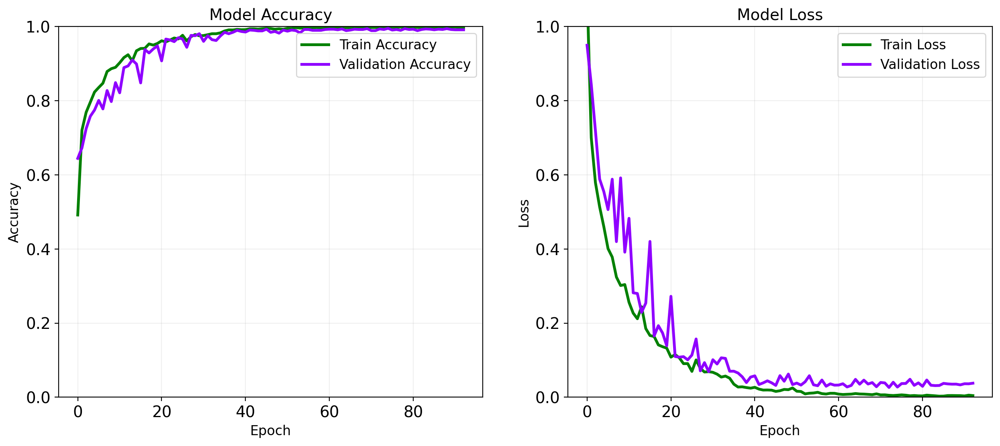

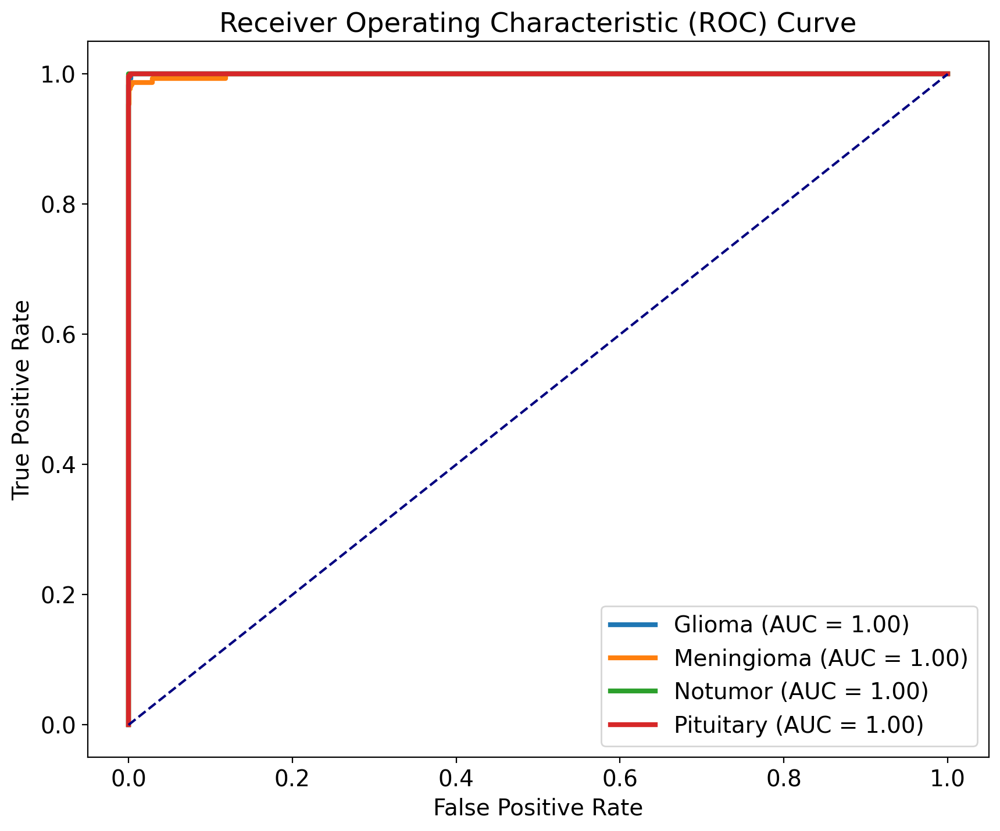

6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 494ms/step


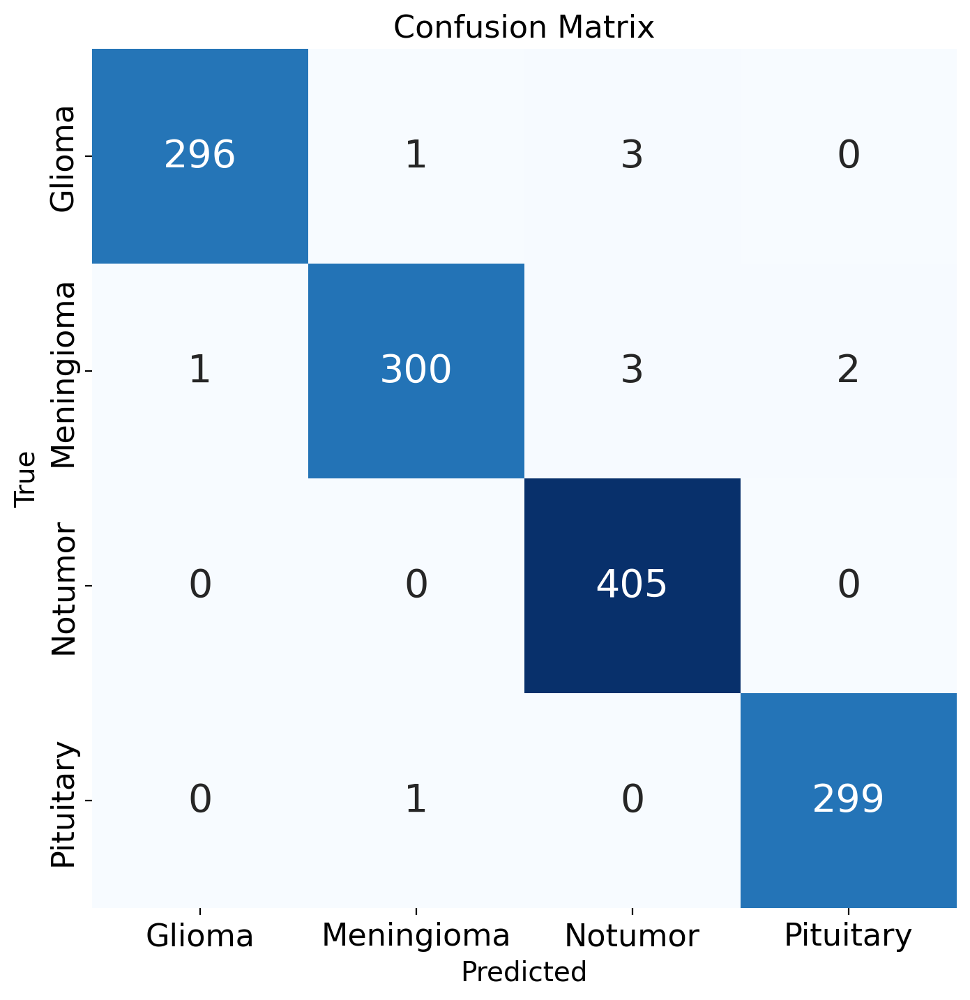

6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 512ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996633  0.986667  0.991625       300
  Meningioma   0.993377  0.980392  0.986842       306
     Notumor   0.985401  1.000000  0.992647       405
   Pituitary   0.993355  0.996667  0.995008       300

    accuracy                       0.991609      1311
   macro avg   0.992192  0.990931  0.991531      1311
weighted avg   0.991653  0.991609  0.991599      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_AdamW_256.h5


In [19]:
# Training batch size
batch_size = 256
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted", fontsize=14)
plt.ylabel("True", fontsize=14)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_AdamW_256.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


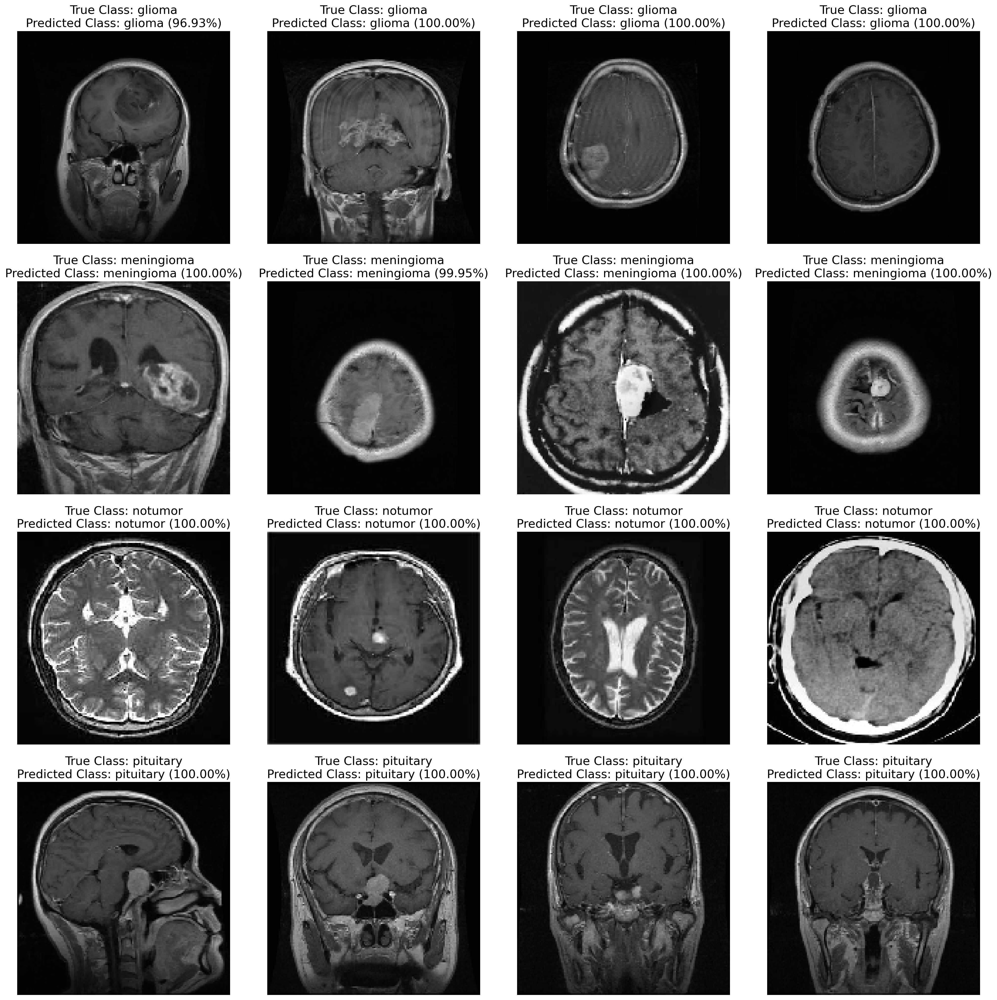

In [20]:
# Function to predict and plot 4 sample images from each class
def predict_and_plot_samples(test_path, class_names, num_samples=4):
    fig, axes = plt.subplots(len(class_names), num_samples, figsize=(20, len(class_names) * 5))  # Create subplots

    for i, class_name in enumerate(class_names):
        # Get the list of images in the selected subclass
        class_dir = os.path.join(test_path, class_name)
        images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

        # If there are not enough images, raise an error
        if len(images) < num_samples:
            raise ValueError(f"Not enough images found in directory {class_dir} for class {class_name}")

        # Select random images
        random_images = random.sample(images, num_samples)

        for j, random_image in enumerate(random_images):
            image_path = os.path.join(class_dir, random_image)

            # Load and preprocess the image
            img = load_img(image_path, target_size=(150, 150))
            img_array = img_to_array(img) / 255.0  # Rescale to [0, 1]
            img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

            # Predict the class
            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions, axis=1)[0]
            predicted_class_name = class_names[predicted_class]
            prediction_percentage = np.max(predictions) * 100

            # Get the true class
            true_class_index = test_generator.class_indices[class_name]
            true_class_name = class_names[true_class_index]

            # Display the image and prediction results
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"True Class: {true_class_name}\nPredicted Class: {predicted_class_name} ({prediction_percentage:.2f}%)")
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Predict and display results for 4 images from each class
predict_and_plot_samples(test_dir, class_names)

In [21]:
import csv
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define datasets
datasets = {
    "Dataset 1": "/kaggle/input/labeled-mri-brain-tumor-dataset/Brain Tumor labeled dataset",
    "Dataset 2": "/kaggle/input/mri-brain-tumor-cleaned/brain_tumor_cleaned/Training",
    "Dataset 3": "/kaggle/input/code-to-cure/Training",
    "Dataset 4": "/kaggle/input/mri-brain-tumor-classification/MRI/Training",
    "Dataset 5": "/kaggle/input/brain-tumor-mri-dataset-final/Training",
}

# Function to evaluate model on a given dataset
def evaluate_on_dataset(dataset_name, dataset_path, model, image_size=(150, 150), batch_size=32):
    # Load test data
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        dataset_path,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Get true labels and predictions
    y_true = test_generator.classes
    y_pred_proba = model.predict(test_generator)
    y_pred = np.argmax(y_pred_proba, axis=1)

    # Generate classification report
    class_labels = list(test_generator.class_indices.keys())
    report = classification_report(y_true, y_pred, target_names=class_labels, digits=6, output_dict=True)
    accuracy = report['accuracy']
    macro_avg = report['macro avg']
    weighted_avg = report['weighted avg']

    # Display the classification report
    print(f"\nClassification Report for {dataset_name}:\n")
    print(classification_report(y_true, y_pred, target_names=class_labels, digits=6))

    # Return consolidated results
    return {
        "Dataset": dataset_name,
        "Accuracy": accuracy,
        "Macro Average Precision": macro_avg["precision"],
        "Macro Average Recall": macro_avg["recall"],
        "Macro Average F1-Score": macro_avg["f1-score"],
        "Weighted Average Precision": weighted_avg["precision"],
        "Weighted Average Recall": weighted_avg["recall"],
        "Weighted Average F1-Score": weighted_avg["f1-score"],
    }

# Consolidate results for all datasets
results = []
for dataset_name, dataset_path in datasets.items():
    print(f"Evaluating on {dataset_name}...")
    metrics = evaluate_on_dataset(dataset_name, dataset_path, model)
    results.append(metrics)

# Save results to CSV
csv_file = "evaluation_results.csv"
csv_columns = list(results[0].keys())

with open(csv_file, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=csv_columns)
    writer.writeheader()
    writer.writerows(results)

# Display results in tabular format
df = pd.DataFrame(results)
print(df)

# Save 
df.to_csv('df256.csv', index=False)
print("DataFrame saved ")

Evaluating on Dataset 1...
Found 2175 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step

Classification Report for Dataset 1:

              precision    recall  f1-score   support

      glioma   1.000000  1.000000  1.000000       455
  meningioma   0.998182  0.998182  0.998182       550
     notumor   0.996377  1.000000  0.998185       550
   pituitary   1.000000  0.996774  0.998384       620

    accuracy                       0.998621      2175
   macro avg   0.998640  0.998739  0.998688      2175
weighted avg   0.998624  0.998621  0.998621      2175

Evaluating on Dataset 2...
Found 5099 images belonging to 4 classes.
  2/160 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step

Classification Report for Dataset 2:

              precision    recall  f1-score   support

      glioma   0.999242  0.998486  0.998864      1321
  meningioma   0.998456  0.996148  0.997300      1298
     notumor   0.996172  1.000000  0.998082      1041
   pituitary   0.997915  0.997915  0.997915      1439

    accuracy                       0.998039      5099
   macro avg   0.997946  0.998137  0.998041      5099
weighted avg   0.998041  0.998039  0.998039      5099

Evaluating on Dataset 3...
Found 5229 images belonging to 4 classes.
  2/164 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


164/164 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step

Classification Report for Dataset 3:

              precision    recall  f1-score   support

      glioma   0.991830  0.997535  0.994674      1217
  meningioma   0.998328  0.985962  0.992106      1211
     notumor   0.993211  1.000000  0.996594      1463
   pituitary   0.999251  0.997758  0.998504      1338

    accuracy                       0.995601      5229
   macro avg   0.995655  0.995314  0.995470      5229
weighted avg   0.995620  0.995601  0.995597      5229

Evaluating on Dataset 4...
Found 5708 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step

Classification Report for Dataset 4:

              precision    recall  f1-score   support

      glioma   0.999242  0.998486  0.998864      1321
  meningioma   0.998503  0.996266  0.997383      1339
     notumor   0.997492  1.000000  0.998745      1591
   pituitary   0.997941  0.997941  0.997941      1457

    accuracy                       0.998248      5708
   macro avg   0.998295  0.998173  0.998233      5708
weighted avg   0.998249  0.998248  0.998248      5708

Evaluating on Dataset 5...
Found 5712 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step

Classification Report for Dataset 5:

                  precision    recall  f1-score   support

    glioma_tumor   0.999242  0.998486  0.998864      1321
meningioma_tumor   0.998503  0.996266  0.997383      1339
        no_tumor   0.997498  1.000000  0.998748      1595
 pituitary_tumor   0.997941  0.997941  0.997941      1457

        accuracy                       0.998249      5712
       macro avg   0.998296  0.998173  0.998234      5712
    weighted avg   0.998250  0.998249  0.998249      5712

     Dataset  Accuracy  Macro Average Precision  Macro Average Recall  \
0  Dataset 1  0.998621                 0.998640              0.998739   
1  Dataset 2  0.998039                 0.997946              0.998137   
2  Dataset 3  0.995601                 0.995655              0.995314   
3  Dataset 4  0.998248                 0.998295              0.998173   
4  Dataset 5  0.998249                 0.998296              0.998173   

   Macro Ave

# Training batch size = 512

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_27 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_27 has kernel size: (4, 4)
Layer conv2d_28 has kernel size: (4, 4)
Layer conv2d_29 has kernel size: (4, 4)
Epoch 1/128


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 12/178 ━━━━━━━━━━━━━━━━━━━━ 2:41 974ms/step - accuracy: 0.3534 - loss: 1.3388

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - accuracy: 0.4124 - loss: 1.2493 - val_accuracy: 0.4325 - val_loss: 1.2086 - learning_rate: 0.0010
Epoch 2/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 111ms/step - accuracy: 0.6292 - loss: 0.8889 - val_accuracy: 0.6346 - val_loss: 1.0128 - learning_rate: 0.0010
Epoch 3/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - accuracy: 0.7025 - loss: 0.7324 - val_accuracy: 0.6995 - val_loss: 0.8436 - learning_rate: 0.0010
Epoch 4/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 93ms/step - accuracy: 0.7367 - loss: 0.6669 - val_accuracy: 0.7025 - val_loss: 0.7167 - learning_rate: 0.0010
Epoch 5/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.7695 - loss: 0.5885 - val_accuracy: 0.7117 - val_loss: 0.7423 - learning_rate: 0.0010
Epoch 6/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 112ms/step - accuracy: 0.7871 - loss: 0.5451 - val_accuracy: 0.6926 - val_loss: 0.7359 - learning_rate: 0.0010
Epoch 7/128
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - accuracy: 0.8006 - l

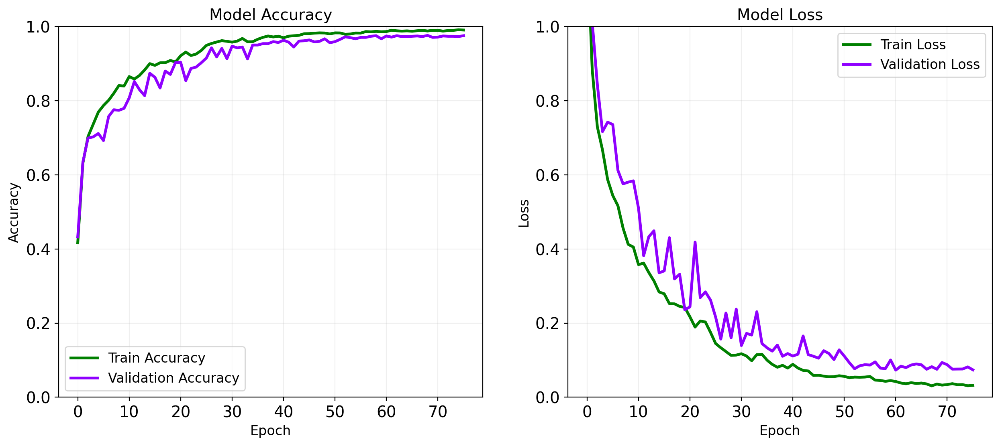

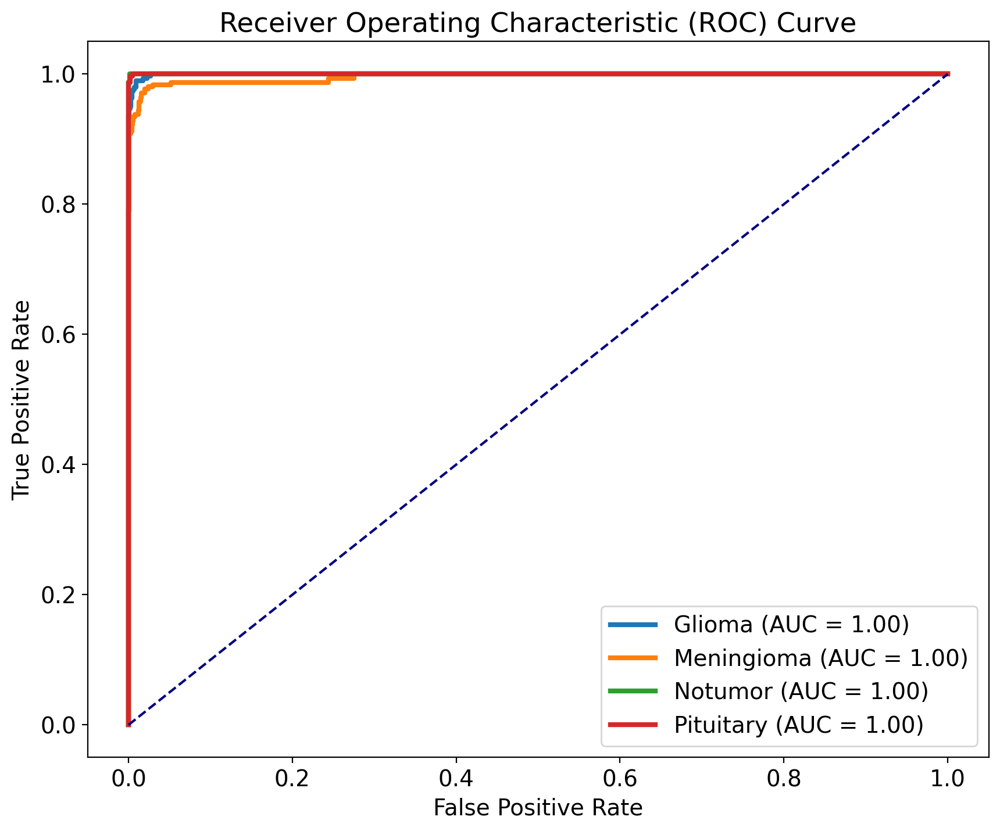

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 882ms/step


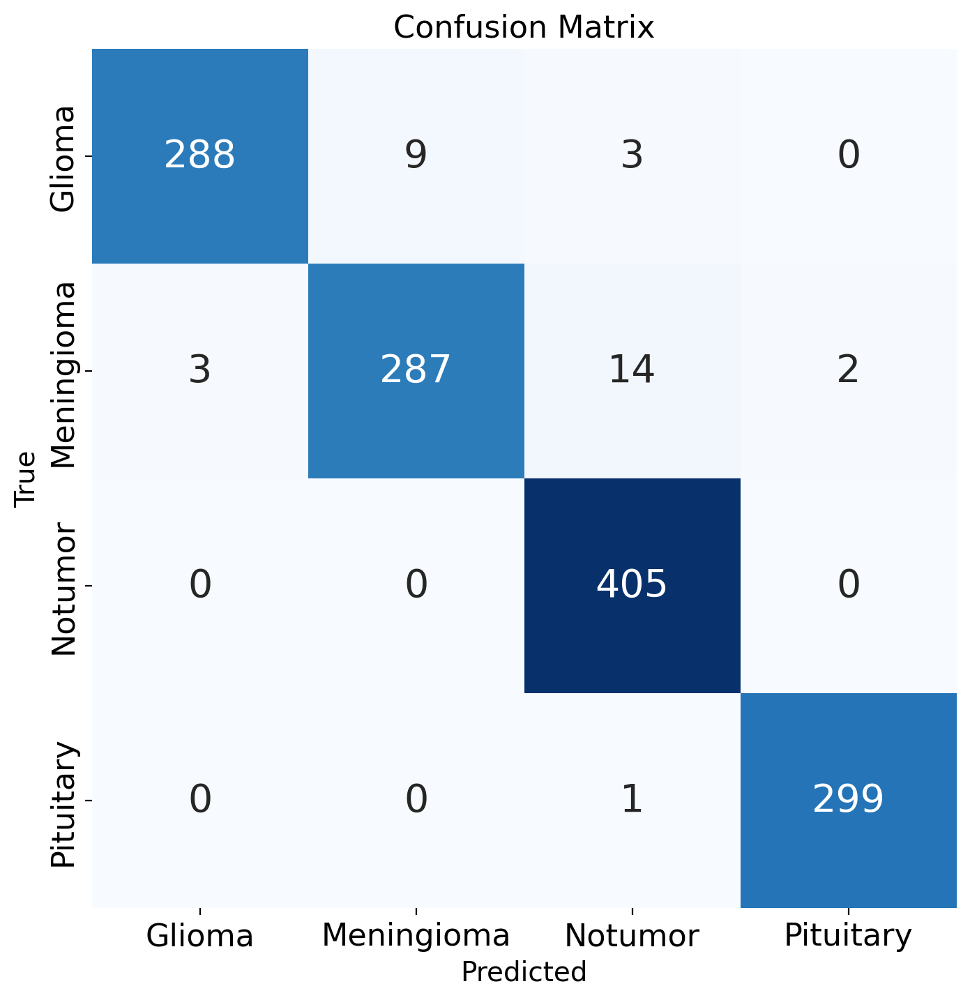

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 923ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.989691  0.960000  0.974619       300
  Meningioma   0.969595  0.937908  0.953488       306
     Notumor   0.957447  1.000000  0.978261       405
   Pituitary   0.993355  0.996667  0.995008       300

    accuracy                       0.975591      1311
   macro avg   0.977522  0.973644  0.975344      1311
weighted avg   0.975878  0.975591  0.975478      1311

Model saved in HDF5 format to /kaggle/working/model_AdamW_AdamW_256.h5


In [22]:
# Training batch size
batch_size = 512
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)
# Define the model architecture 1
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=8, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])


# Get predictions
y_true = test_generator.classes
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Accuracy Plot
ax[0].plot(history.history['accuracy'], color='green', linewidth=2.5, label='Train Accuracy')  # Green
ax[0].plot(history.history['val_accuracy'], color='#8F00FF', linewidth=2.5, label='Validation Accuracy')  # Magenta
ax[0].set_title('Model Accuracy', fontsize=14)
ax[0].set_xlabel('Epoch', fontsize=12)
ax[0].set_ylabel('Accuracy', fontsize=12)
ax[0].set_ylim(0, 1)
ax[0].legend(fontsize=12)
ax[0].grid(alpha=0.2)

# Loss Plot
ax[1].plot(history.history['loss'], color='green', linewidth=2.5, label='Train Loss')  # Purple
ax[1].plot(history.history['val_loss'], color='#8F00FF', linewidth=2.5, label='Validation Loss')  # Pink
ax[1].set_title('Model Loss', fontsize=14)
ax[1].set_xlabel('Epoch', fontsize=12)
ax[1].set_ylabel('Loss', fontsize=12)
ax[1].set_ylim(0, 1)
ax[1].legend(fontsize=12)
ax[1].grid(alpha=0.2)
plt.show()

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, linewidth=3, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')  # Increased line width

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"size": 20})  # Increased font size
plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted", fontsize=14)
plt.ylabel("True", fontsize=14)
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center', fontsize=16)
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center', fontsize=16)
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

model_save_path = '/kaggle/working/model_AdamW_AdamW_256.h5'
model.save(model_save_path)
print(f"Model saved in HDF5 format to {model_save_path}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


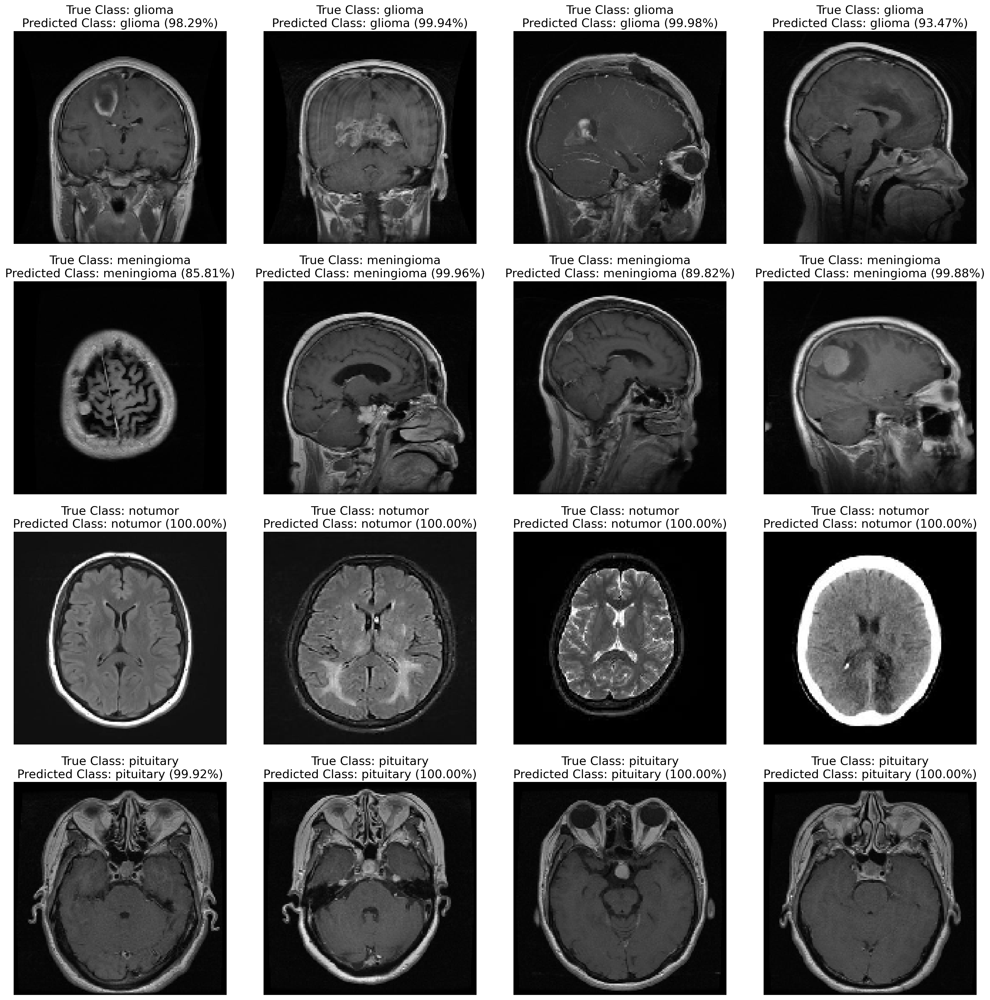

In [23]:
# Function to predict and plot 4 sample images from each class
def predict_and_plot_samples(test_path, class_names, num_samples=4):
    fig, axes = plt.subplots(len(class_names), num_samples, figsize=(20, len(class_names) * 5))  # Create subplots

    for i, class_name in enumerate(class_names):
        # Get the list of images in the selected subclass
        class_dir = os.path.join(test_path, class_name)
        images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

        # If there are not enough images, raise an error
        if len(images) < num_samples:
            raise ValueError(f"Not enough images found in directory {class_dir} for class {class_name}")

        # Select random images
        random_images = random.sample(images, num_samples)

        for j, random_image in enumerate(random_images):
            image_path = os.path.join(class_dir, random_image)

            # Load and preprocess the image
            img = load_img(image_path, target_size=(150, 150))
            img_array = img_to_array(img) / 255.0  # Rescale to [0, 1]
            img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

            # Predict the class
            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions, axis=1)[0]
            predicted_class_name = class_names[predicted_class]
            prediction_percentage = np.max(predictions) * 100

            # Get the true class
            true_class_index = test_generator.class_indices[class_name]
            true_class_name = class_names[true_class_index]

            # Display the image and prediction results
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"True Class: {true_class_name}\nPredicted Class: {predicted_class_name} ({prediction_percentage:.2f}%)")
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Predict and display results for 4 images from each class
predict_and_plot_samples(test_dir, class_names)

In [24]:
import csv
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define datasets
datasets = {
    "Dataset 1": "/kaggle/input/labeled-mri-brain-tumor-dataset/Brain Tumor labeled dataset",
    "Dataset 2": "/kaggle/input/mri-brain-tumor-cleaned/brain_tumor_cleaned/Training",
    "Dataset 3": "/kaggle/input/code-to-cure/Training",
    "Dataset 4": "/kaggle/input/mri-brain-tumor-classification/MRI/Training",
    "Dataset 5": "/kaggle/input/brain-tumor-mri-dataset-final/Training",
}

# Function to evaluate model on a given dataset
def evaluate_on_dataset(dataset_name, dataset_path, model, image_size=(150, 150), batch_size=32):
    # Load test data
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        dataset_path,
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Get true labels and predictions
    y_true = test_generator.classes
    y_pred_proba = model.predict(test_generator)
    y_pred = np.argmax(y_pred_proba, axis=1)

    # Generate classification report
    class_labels = list(test_generator.class_indices.keys())
    report = classification_report(y_true, y_pred, target_names=class_labels, digits=6, output_dict=True)
    accuracy = report['accuracy']
    macro_avg = report['macro avg']
    weighted_avg = report['weighted avg']

    # Display the classification report
    print(f"\nClassification Report for {dataset_name}:\n")
    print(classification_report(y_true, y_pred, target_names=class_labels, digits=6))

    # Return consolidated results
    return {
        "Dataset": dataset_name,
        "Accuracy": accuracy,
        "Macro Average Precision": macro_avg["precision"],
        "Macro Average Recall": macro_avg["recall"],
        "Macro Average F1-Score": macro_avg["f1-score"],
        "Weighted Average Precision": weighted_avg["precision"],
        "Weighted Average Recall": weighted_avg["recall"],
        "Weighted Average F1-Score": weighted_avg["f1-score"],
    }

# Consolidate results for all datasets
results = []
for dataset_name, dataset_path in datasets.items():
    print(f"Evaluating on {dataset_name}...")
    metrics = evaluate_on_dataset(dataset_name, dataset_path, model)
    results.append(metrics)

# Save results to CSV
csv_file = "evaluation_results.csv"
csv_columns = list(results[0].keys())

with open(csv_file, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=csv_columns)
    writer.writeheader()
    writer.writerows(results)

# Display results in tabular format
df = pd.DataFrame(results)
print(df)

# Save 
df.to_csv('df256.csv', index=False)
print("DataFrame saved ")

Evaluating on Dataset 1...
Found 2175 images belonging to 4 classes.


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step

Classification Report for Dataset 1:

              precision    recall  f1-score   support

      glioma   0.993363  0.986813  0.990077       455
  meningioma   0.994413  0.970909  0.982521       550
     notumor   0.973451  1.000000  0.986547       550
   pituitary   0.996779  0.998387  0.997583       620

    accuracy                       0.989425      2175
   macro avg   0.989502  0.989027  0.989182      2175
weighted avg   0.989567  0.989425  0.989413      2175

Evaluating on Dataset 2...
Found 5099 images belonging to 4 classes.
  2/160 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step

Classification Report for Dataset 2:

              precision    recall  f1-score   support

      glioma   0.992390  0.987131  0.989753      1321
  meningioma   0.989899  0.981510  0.985687      1298
     notumor   0.986730  1.000000  0.993321      1041
   pituitary   0.995842  0.998610  0.997224      1439

    accuracy                       0.991567      5099
   macro avg   0.991215  0.991813  0.991496      5099
weighted avg   0.991574  0.991567  0.991555      5099

Evaluating on Dataset 3...
Found 5229 images belonging to 4 classes.
  2/164 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


164/164 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step

Classification Report for Dataset 3:

              precision    recall  f1-score   support

      glioma   0.972425  0.985210  0.978776      1217
  meningioma   0.989700  0.952106  0.970539      1211
     notumor   0.981221  1.000000  0.990521      1463
   pituitary   0.994776  0.996263  0.995519      1338

    accuracy                       0.984509      5229
   macro avg   0.984530  0.983395  0.983839      5229
weighted avg   0.984606  0.984509  0.984439      5229

Evaluating on Dataset 4...
Found 5708 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step

Classification Report for Dataset 4:

              precision    recall  f1-score   support

      glioma   0.992390  0.987131  0.989753      1321
  meningioma   0.990189  0.979836  0.984985      1339
     notumor   0.989428  1.000000  0.994686      1591
   pituitary   0.995893  0.998627  0.997258      1457

    accuracy                       0.991941      5708
   macro avg   0.991975  0.991398  0.991671      5708
weighted avg   0.991942  0.991941  0.991925      5708

Evaluating on Dataset 5...
Found 5712 images belonging to 4 classes.
  2/179 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


179/179 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step

Classification Report for Dataset 5:

                  precision    recall  f1-score   support

    glioma_tumor   0.992390  0.987131  0.989753      1321
meningioma_tumor   0.990189  0.979836  0.984985      1339
        no_tumor   0.989454  1.000000  0.994699      1595
 pituitary_tumor   0.995893  0.998627  0.997258      1457

        accuracy                       0.991947      5712
       macro avg   0.991981  0.991398  0.991674      5712
    weighted avg   0.991948  0.991947  0.991931      5712

     Dataset  Accuracy  Macro Average Precision  Macro Average Recall  \
0  Dataset 1  0.989425                 0.989502              0.989027   
1  Dataset 2  0.991567                 0.991215              0.991813   
2  Dataset 3  0.984509                 0.984530              0.983395   
3  Dataset 4  0.991941                 0.991975              0.991398   
4  Dataset 5  0.991947                 0.991981              0.991398   

   Macro Ave